# <h1 style="color: Green; font-size: 32px;"> Imports </h1>

In [138]:
# Standard Library Imports
import os
import sys
from typing import List, Any, Callable, Union, Tuple, Optional
from importlib import reload
from functools import partial
from glob import glob
import cftime
import string
# Third-Party Library Imports
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.gridspec as gridspec
import seaborn as sns
import pymannkendall
import cartopy.crs as ccrs
from matplotlib.ticker import MaxNLocator

# Custom Module Imports
sys.path.append(os.path.join(os.getcwd(), 'Documents', 'zecmip_stabilisation'))
import constants
sys.path.append(constants.MODULE_DIR)
import open_zecmip
import utils
import plotting_functions
import zec_calculation_functions
import sn_plotting
import my_stats
import signal_to_noise_calculations as sn_calc
logger = utils.get_notebook_logger()
# Suppress Warnings
import warnings
warnings.filterwarnings('ignore')

In [139]:
constants.MODULE_DIR

'/home/563/ab2313/Documents/zecmip_stabilisation/src'

In [140]:
np.set_printoptions(precision=2, suppress=True, edgeitems=1)
xr.set_options(display_expand_data=False)

In [141]:
sys.path.append(os.path.join(os.getcwd(), 'Documents', 'list_xarray'))
from listXarray import listXarray

In [142]:
# client.close()

In [143]:
from dask.distributed import Client
client = Client(threads_per_worker=1, memory_limit=None, n_workers=12)
client

- State start
-   Scheduler at:     tcp://127.0.0.1:39885
-   dashboard at:        /proxy/40539/status
- Registering Worker plugin shuffle
-         Start Nanny at: 'tcp://127.0.0.1:44583'
-         Start Nanny at: 'tcp://127.0.0.1:42653'
-         Start Nanny at: 'tcp://127.0.0.1:34565'
-         Start Nanny at: 'tcp://127.0.0.1:44943'
-         Start Nanny at: 'tcp://127.0.0.1:40449'
-         Start Nanny at: 'tcp://127.0.0.1:34775'
-         Start Nanny at: 'tcp://127.0.0.1:41395'
-         Start Nanny at: 'tcp://127.0.0.1:34783'
-         Start Nanny at: 'tcp://127.0.0.1:42453'
-         Start Nanny at: 'tcp://127.0.0.1:32769'
-         Start Nanny at: 'tcp://127.0.0.1:34013'
-         Start Nanny at: 'tcp://127.0.0.1:42729'
- Register worker <WorkerState 'tcp://127.0.0.1:38325', name: 2, status: init, memory: 0, processing: 0>
- Starting worker compute stream, tcp://127.0.0.1:38325
- Starting established connection to tcp://127.0.0.1:55616
- Register worker <WorkerState 'tcp://127

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: /proxy/40539/status,
Dashboard: /proxy/40539/status,Workers: 12
Total threads: 12,Total memory: 0 B
Status: running,Using processes: True
Comm: tcp://127.0.0.1:39885,Workers: 12
Dashboard: /proxy/40539/status,Total threads: 12
Started: Just now,Total memory: 0 B
Comm: tcp://127.0.0.1:35987,Total threads: 1
Dashboard: /proxy/36653/status,Memory: 0 B
Nanny: tcp://127.0.0.1:44583,


- Remove client Client-e2892eb9-ad22-11ef-a764-00000571fe80
- Received 'close-stream' from tcp://127.0.0.1:55714; closing.
- Remove client Client-e2892eb9-ad22-11ef-a764-00000571fe80
- Close client connection: Client-e2892eb9-ad22-11ef-a764-00000571fe80
- Retire worker addresses (0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11)
- Received 'close-stream' from tcp://127.0.0.1:55678; closing.
- Received 'close-stream' from tcp://127.0.0.1:55636; closing.
- Received 'close-stream' from tcp://127.0.0.1:55616; closing.
- Received 'close-stream' from tcp://127.0.0.1:55622; closing.
- Received 'close-stream' from tcp://127.0.0.1:55662; closing.
- Received 'close-stream' from tcp://127.0.0.1:55660; closing.
- Received 'close-stream' from tcp://127.0.0.1:55640; closing.
- Received 'close-stream' from tcp://127.0.0.1:55652; closing.
- Received 'close-stream' from tcp://127.0.0.1:55680; closing.
- Received 'close-stream' from tcp://127.0.0.1:55664; closing.
- Remove worker <WorkerState 'tcp://127.0.0.1:35987

# <h1 style="color: Green; font-size: 32px;"> Opening Data </h1>

In [144]:
chunks = {'lat':-1, 'lon':-1, 'time':-1, 'ensemble':-1}

In [145]:
a1_raw_xrlist = open_zecmip.extract_experiment_into_xrlist('1000pgc', 'tas', chunks=chunks, logginglevel='ERROR'
                                                          ).to_dataarray('tas').sort_by_refkey()

In [146]:
pct_raw_xrlist = open_zecmip.extract_experiment_into_xrlist('1pct', 'tas', chunks=chunks).to_dataarray('tas').sort_by_refkey()

In [147]:
# esmpi_raw_xrlist = (open_zecmip.extract_experiment_into_xrlist('esm-piControl', 'tas', chunks=chunks, logginglevel='INFO')
#                     .to_dataarray('tas')
#                     .isel(ensemble=0)
#                     .squeeze('ensemble')
#                     .sort_by_refkey()
#                     .rename({'latitude':'lat', 'longitude': 'lon'}))

In [148]:
esmpi_raw_xrlist = (open_zecmip.extract_experiment_into_xrlist('picontrol', 'tas', chunks=chunks, logginglevel='INFO')
                    .to_dataarray('tas')
                    .isel(ensemble=0)
                    .squeeze('ensemble')
                    .sort_by_refkey()
                    .rename({'latitude':'lat', 'longitude': 'lon'}))

- ACCESS-ESM1-5
-      r1i1p1f1 - /g/data/fs38/publications/CMIP6/CMIP/CSIRO/ACCESS-ESM1-5/piControl/r1i1p1f1/Amon/tas/gn/v20210316/*.nc
- CanESM5
-      r1i1p1f1 - /g/data/oi10/replicas/CMIP6/CMIP/CCCma/CanESM5/piControl/r1i1p1f1/Amon/tas/gn/v20190429/*.nc
-      r1i1p2f1 - /g/data/oi10/replicas/CMIP6/CMIP/CCCma/CanESM5/piControl/r1i1p2f1/Amon/tas/gn/v20190429/*.nc
- MIROC-ES2L
-      r1i1p1f2 - /g/data/oi10/replicas/CMIP6/CMIP/MIROC/MIROC-ES2L/piControl/r1i1p1f2/Amon/tas/gn/v20190823/*.nc
- UKESM1-0-LL
-      r1i1p1f2 - /g/data/oi10/replicas/CMIP6/CMIP/MOHC/UKESM1-0-LL/piControl/r1i1p1f2/Amon/tas/gn/v20200828/*.nc
- MPI-ESM1-2-LR
-      r1i1p1f1 - /g/data/oi10/replicas/CMIP6/CMIP/MPI-M/MPI-ESM1-2-LR/piControl/r1i1p1f1/Amon/tas/gn/v20190710/*.nc
-      r2i1p1f1 - /g/data/oi10/replicas/CMIP6/CMIP/MPI-M/MPI-ESM1-2-LR/piControl/r2i1p1f1/Amon/tas/gn/v20190815/*.nc
- GISS-E2-1-G-CC
-      r1i1p1f1 - /g/data/oi10/replicas/CMIP6/CMIP/NASA-GISS/GISS-E2-1-G-CC/piControl/r1i1p1f1/Amon/tas/gn/v2

In [149]:
# Match all the ensemble dimensions
pct_raw_xrlist = pct_raw_xrlist.cross_match_dim(a1_raw_xrlist, 'ensemble')
a1_raw_xrlist = a1_raw_xrlist.cross_match_dim(pct_raw_xrlist, 'ensemble')

In [150]:
# Only selecting one ensemble member for each model
a1_raw_xrlist = a1_raw_xrlist.isel(ensemble=0)#.chunk('auto')
pct_raw_xrlist = pct_raw_xrlist.isel(ensemble=0)#.chunk('auto')
esmpi_raw_xrlist = esmpi_raw_xrlist.isel(ensemble=0)#.chunk('auto')

In [151]:
# After the year 1000 all values appear to be 0
# esmpi_raw_xrlist['CanESM5'] = esmpi_raw_xrlist['CanESM5'].isel(time=slice(None,1000))

In [152]:
a1_raw_xrlist

key_dim = model


Number of da/ds: 9
---------------
ACCESS-ESM1-5  (dataArray): ({'model': 1, 'time': 1212, 'lat': 145, 'lon': 192})
              (Array: 128.72, Chunk: 128.72Mib) ({'model': (1,), 'time': (1212,), 'lat': (145,), 'lon': (192,)})
CESM2          (dataArray): ({'model': 1, 'time': 1800, 'lat': 192, 'lon': 288})
              (Array: 379.69, Chunk: 126.56Mib) ({'model': (1,), 'time': (600, 600, 600), 'lat': (192,), 'lon': (288,)})
CanESM5        (dataArray): ({'model': 1, 'time': 1200, 'lat': 64, 'lon': 128})
              (Array: 37.50, Chunk: 37.5Mib) ({'model': (1,), 'time': (1200,), 'lat': (64,), 'lon': (128,)})
GFDL-ESM4      (dataArray): ({'model': 1, 'time': 2400, 'lat': 180, 'lon': 288})
              (Array: 474.61, Chunk: 237.3Mib) ({'model': (1,), 'time': (1200, 1200), 'lat': (180,), 'lon': (288,)})
GISS-E2-1-G-CC (dataArray): ({'model': 1, 'time': 2160, 'lat': 90, 'lon': 144})
              (Array: 106.79, Chunk: 18.39Mib) ({'model': (1,), 'time': (372, 600, 600, 588), 'lat': (

# <h1 style="color: Green; font-size: 32px;"> Calculations </h1>

##  Data Processing and GMST Calculation

In [153]:
# Convert to celcius
a1_raw_xrlist = a1_raw_xrlist - 273.15
pct_raw_xrlist = pct_raw_xrlist - 273.15
esmpi_raw_xrlist = esmpi_raw_xrlist - 273.15

In [154]:
# esmpi_regrid_xrlist = esmpi_raw_xrlist.regrid('MPI-ESM1-2-LR', 'bilinear').set_refkeys('model')
# pct_regrid_xrlist = pct_raw_xrlist.regrid('MPI-ESM1-2-LR', 'bilinear').set_refkeys('model')
# a1_regrid_xrlist = a1_raw_xrlist.regrid('MPI-ESM1-2-LR', 'bilinear').set_refkeys('model')

In [155]:
# Making the data yearly
esmpi_xrlist = esmpi_raw_xrlist.resample(time='Y').mean(dim='time').set_refkeys('model')#.chunk('auto')
pct_xrlist = pct_raw_xrlist.resample(time='Y').mean(dim='time').set_refkeys('model')#.chunk('auto')
a1_xrlist = a1_raw_xrlist.resample(time='Y').mean(dim='time').set_refkeys('model')#.chunk('auto')

In [156]:
a1_xrlist

key_dim = model


Number of da/ds: 9
---------------
ACCESS-ESM1-5  (dataArray): ({'model': 1, 'time': 101, 'lat': 145, 'lon': 192})
              (Array: 10.73, Chunk: 10.73Mib) ({'model': (1,), 'time': (101,), 'lat': (145,), 'lon': (192,)})
CESM2          (dataArray): ({'model': 1, 'time': 150, 'lat': 192, 'lon': 288})
              (Array: 31.64, Chunk: 10.55Mib) ({'model': (1,), 'time': (50, 50, 50), 'lat': (192,), 'lon': (288,)})
CanESM5        (dataArray): ({'model': 1, 'time': 100, 'lat': 64, 'lon': 128})
              (Array: 3.12, Chunk: 3.12Mib) ({'model': (1,), 'time': (100,), 'lat': (64,), 'lon': (128,)})
GFDL-ESM4      (dataArray): ({'model': 1, 'time': 200, 'lat': 180, 'lon': 288})
              (Array: 39.55, Chunk: 19.78Mib) ({'model': (1,), 'time': (100, 100), 'lat': (180,), 'lon': (288,)})
GISS-E2-1-G-CC (dataArray): ({'model': 1, 'time': 180, 'lat': 90, 'lon': 144})
              (Array: 8.90, Chunk: 1.53Mib) ({'model': (1,), 'time': (31, 50, 50, 49), 'lat': (90,), 'lon': (144,)})
MIR

In [157]:
# The global weighted mean
pct_smean_xrlist = pct_xrlist.apply(my_stats.space_mean)
a1_smean_xrlist = a1_xrlist.apply(my_stats.space_mean)
esmpi_smean_xrlist = esmpi_xrlist.apply(my_stats.space_mean)

model
model
model


In [158]:
%%time
esmpi_smean_xrlist = esmpi_smean_xrlist.compute()
a1_smean_xrlist = a1_smean_xrlist.compute()
pct_smean_xrlist = pct_smean_xrlist.compute()

CPU times: user 22.9 s, sys: 3.9 s, total: 26.8 s
Wall time: 58.4 s


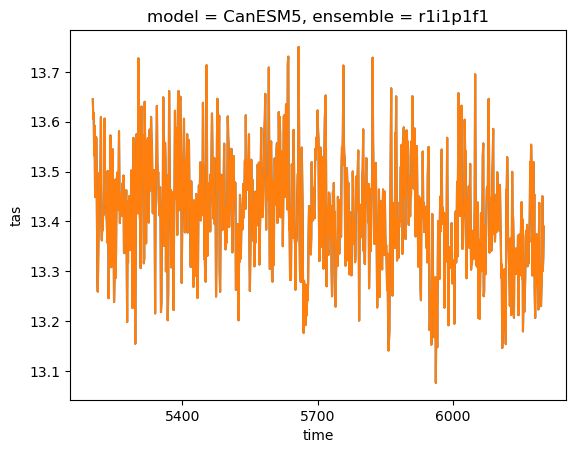

In [159]:
esmpi_smean_xrlist['CanESM5'].plot()
esmpi_smean_xrlist['CanESM5'].isel(time=slice(None, 1000)).plot()

In [160]:
esmpi_smean_xrlist['CanESM5'] = esmpi_smean_xrlist['CanESM5'].isel(time=slice(None, 1000))

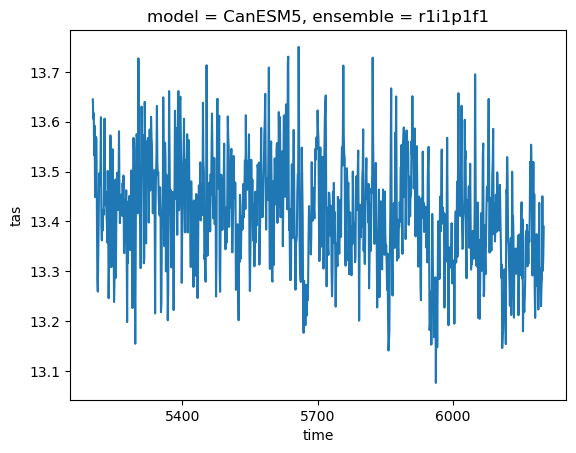

In [161]:
esmpi_smean_xrlist['CanESM5'].plot()

## Branch point calculations

In [162]:
# Calculate the values at the branching point
branch_point_mean_xrlist = listXarray([zec_calculation_functions.calculate_branch_average(
    pct_smean_xrlist[model], a1_smean_xrlist[model], logginglevel='INFO') for model in pct_smean_xrlist.refkeys]).set_refkeys('model')

- ['ACCESS-ESM1-5'] - ['ACCESS-ESM1-5']
- branch_start_time=cftime.DatetimeProlepticGregorian(168, 12, 31, 0, 0, 0, 0, has_year_zero=True)
- onepct_branch_arg=67
- 

- ['CESM2'] - ['CESM2']
- branch_start_time=cftime.DatetimeNoLeap(68, 12, 31, 0, 0, 0, 0, has_year_zero=True)
- onepct_branch_arg=67
- 

- ['CanESM5'] - ['CanESM5']
- branch_start_time=cftime.DatetimeNoLeap(1911, 12, 31, 0, 0, 0, 0, has_year_zero=True)
- onepct_branch_arg=61
- 

- ['GFDL-ESM4'] - ['GFDL-ESM4']
- branch_start_time=cftime.DatetimeNoLeap(64, 12, 31, 0, 0, 0, 0, has_year_zero=True)
- onepct_branch_arg=63
- 

- ['GISS-E2-1-G-CC'] - ['GISS-E2-1-G-CC']
- branch_start_time=cftime.DatetimeNoLeap(1920, 12, 31, 0, 0, 0, 0, has_year_zero=True)
- onepct_branch_arg=70
- 

- ['MIROC-ES2L'] - ['MIROC-ES2L']
- branch_start_time=cftime.DatetimeGregorian(1913, 12, 31, 0, 0, 0, 0, has_year_zero=False)
- onepct_branch_arg=63
- 

- ['MPI-ESM1-2-LR'] - ['MPI-ESM1-2-LR']
- branch_start_time=cftime.DatetimeProlepticGregorian(1915,

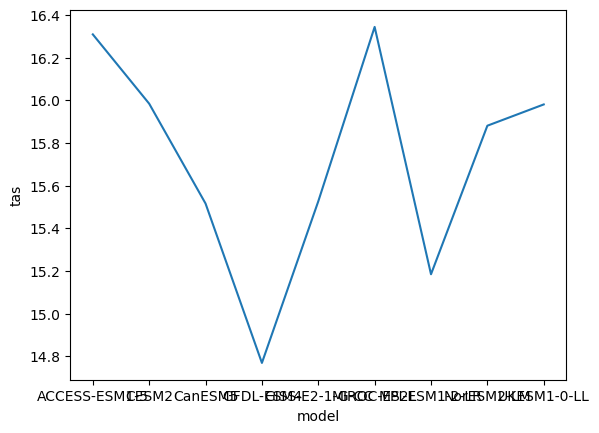

In [163]:
branch_point_mean_xrlist.concat('model').plot()

In [164]:
# The amomaly time series from the branch point
a1_smean_zec_anom_xrlist = (a1_smean_xrlist - branch_point_mean_xrlist).compute()
#a1_smean_anom_xrlist_pre_combine

In [165]:
# All modles now have matching coordinates - can now be converted to xarray
# previosly a1 was a1_smean_anom_xrlist
a1_smean_zec_anom_ds = a1_smean_zec_anom_xrlist.copy(deep=True).apply(utils.reset_time_to_0_start).concat('model').drop('ensemble')
a1_smean_ds = a1_smean_xrlist.copy(deep=True).apply(utils.reset_time_to_0_start).concat('model').drop('ensemble')
pct_smean_ds = pct_smean_xrlist.copy(deep=True).apply(utils.reset_time_to_0_start).concat('model').drop('ensemble')
esmpi_smean_ds = esmpi_smean_xrlist.copy(deep=True).apply(utils.reset_time_to_0_start).concat('model').drop('ensemble')

model
model
model
model


In [166]:
a1_smean_ds['time'] = a1_smean_ds.time.dt.year.values

In [167]:
# a1_smean_anom_ds.time.values[-3:], a1_smean_anom_ds.time.values[:3]

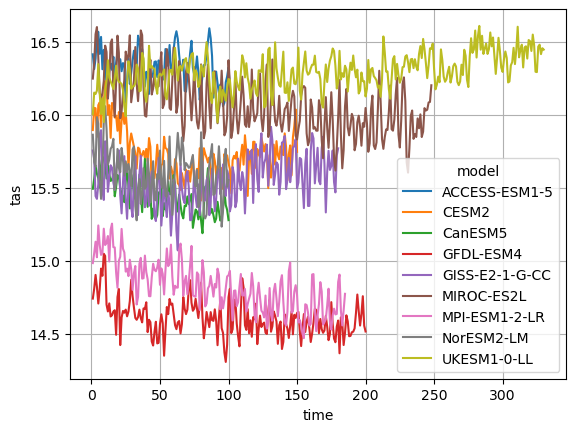

In [168]:
a1_smean_ds.plot(hue='model');
plt.grid()

In [169]:
# This way procudes the same as when you average first then take the anomalies. However, we also get the anomaleis
# time series which is useful
zec25_ds = a1_smean_zec_anom_ds.isel(time=slice(15, 35)).mean(dim='time')
zec50_ds = a1_smean_zec_anom_ds.isel(time=slice(40, 60)).mean(dim='time')
zec50_ds

<xarray.DataArray 'tas' (model: 9)> Size: 72B
0.01126 -0.3094 -0.1017 -0.2055 -0.09005 -0.1087 -0.2702 -0.3344 0.2892
Coordinates:
  * model    (model) <U14 504B 'ACCESS-ESM1-5' 'CESM2' ... 'UKESM1-0-LL'

In [170]:
zec50_ds.to_pandas().sort_index().round(2)

model
ACCESS-ESM1-5     0.01
CESM2            -0.31
CanESM5          -0.10
GFDL-ESM4        -0.21
GISS-E2-1-G-CC   -0.09
MIROC-ES2L       -0.11
MPI-ESM1-2-LR    -0.27
NorESM2-LM       -0.33
UKESM1-0-LL       0.29
dtype: float64

In [171]:
# a1_smean_anom_ds = a1_smean_anom_ds.dropna(dim='time')

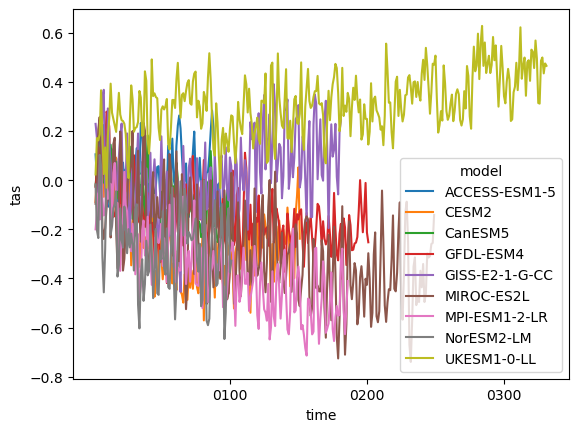

In [172]:
a1_smean_zec_anom_ds.plot(hue='model');

## De-trending

In [173]:
my_stats.trend_fit

<function my_stats.trend_fit(da: xarray.core.dataarray.DataArray, method: str = None, order: int = 1, lowess_window: int = 30, func_kwargs: Optional[Dict] = {}, logginglevel='ERROR')>

In [174]:
# Detrend the data
a1_smean_trendfit_lowess_ds = my_stats.trend_fit(a1_smean_ds, method='lowess', lowess_window=51)
# Anomalies with lowess filter
a1_smean_anom_trendfit_lowess_ds = a1_smean_trendfit_lowess_ds - a1_smean_trendfit_lowess_ds.isel(time=0)
# The lowess detrended
a1_smean_anom_detrend_lowess_ds = a1_smean_ds - a1_smean_anom_trendfit_lowess_ds

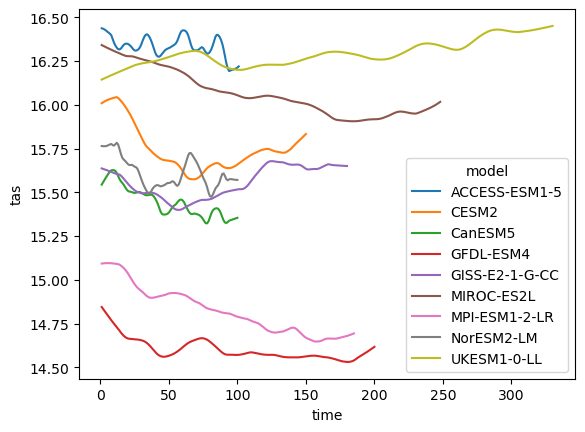

In [175]:
a1_smean_trendfit_lowess_ds.plot(hue='model');

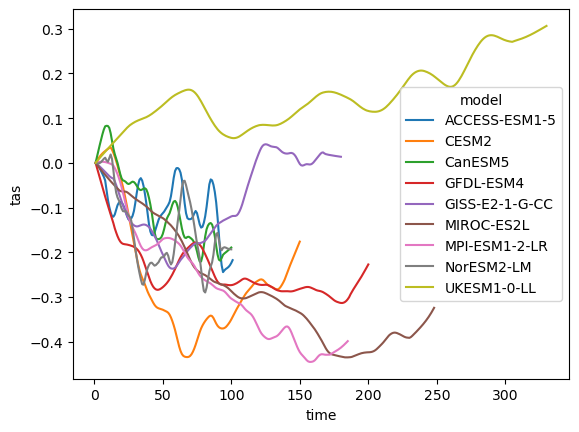

In [176]:
a1_smean_anom_trendfit_lowess_ds.plot(hue='model');

In [177]:
# Detrend the data
a1_smean_anom_trendfit_poly_ds = my_stats.trend_fit(a1_smean_ds, method='polynomial', order=4)
a1_smean_anom_detrend_poly_ds = a1_smean_ds - a1_smean_anom_trendfit_poly_ds

In [178]:
# Generatic variabiles assignment 
# Can swap between filters
a1_smean_anom_trendfit_ds = a1_smean_anom_trendfit_lowess_ds #a1_smean_anom_trendfit_poly_ds
a1_smean_anom_detrend_ds = a1_smean_anom_detrend_lowess_ds #a1_smean_anom_detrend_poly_ds
a1_smean_trendfit_ds = a1_smean_trendfit_lowess_ds

In [179]:
a1_smean_anom_detrend_ds

<xarray.DataArray 'tas' (model: 9, time: 330)> Size: 24kB
16.41 16.31 16.39 16.56 16.59 16.44 ... 15.99 16.17 16.18 16.11 16.15 16.14
Coordinates:
  * model    (model) <U14 504B 'ACCESS-ESM1-5' 'CESM2' ... 'UKESM1-0-LL'
  * time     (time) int64 3kB 1 2 3 4 5 6 7 8 ... 324 325 326 327 328 329 330

In [180]:
# Calculating the anomalies
a1_smean_anom_ds = a1_smean_ds - a1_smean_trendfit_ds.isel(time=0)

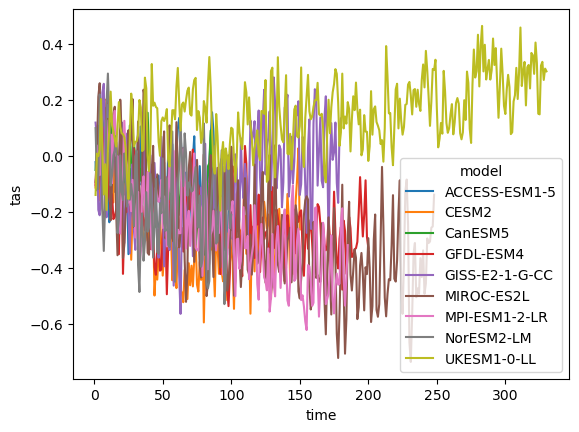

In [181]:
a1_smean_anom_ds.plot(hue='model');

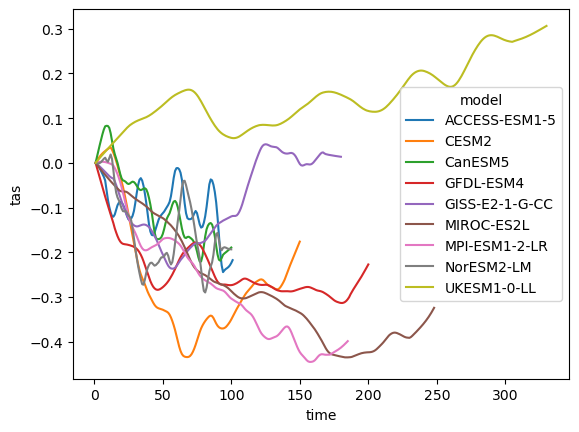

In [182]:
a1_smean_anom_trendfit_ds.plot(hue='model');

In [183]:
models = a1_smean_anom_detrend_ds.model.values

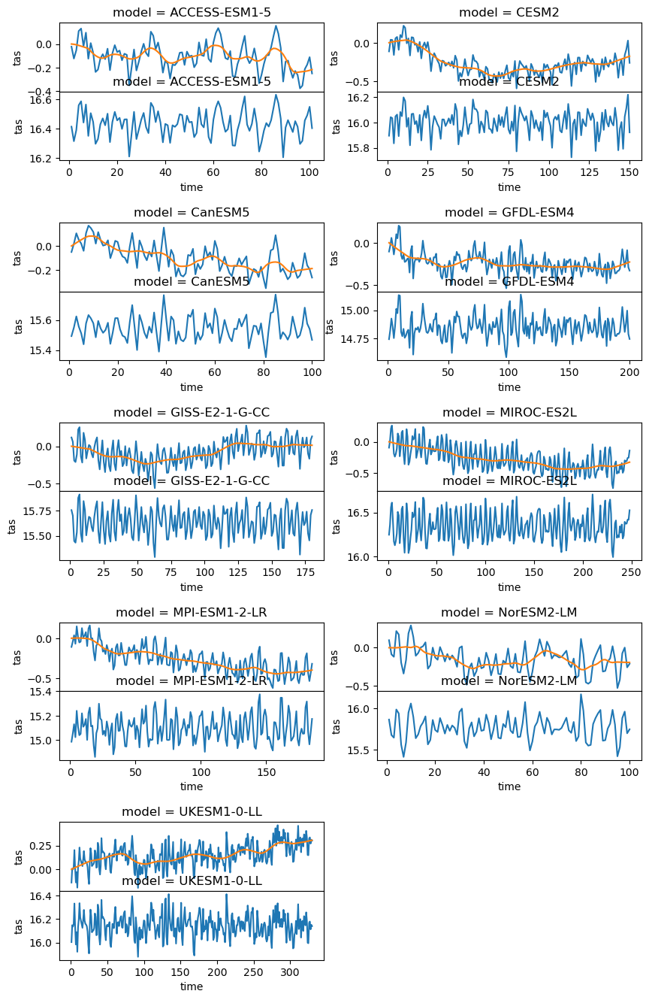

In [184]:
fig = plt.figure(figsize=(10, 30))
outer_gs = gridspec.GridSpec(len(models),2, hspace=0.45)

for num, model in enumerate(models):
    innter_gs = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=outer_gs[num], hspace=0)

    ax_top = fig.add_subplot(innter_gs[0])
    ax_bottom = fig.add_subplot(innter_gs[1])

    a1_smean_anom_ds.sel(model=model).plot(ax=ax_top, label='Raw')
    a1_smean_anom_trendfit_ds.sel(model=model).plot(ax=ax_top, label='Trend Fit')
    a1_smean_anom_detrend_ds.sel(model=model).plot(ax=ax_bottom, label='Detrended')

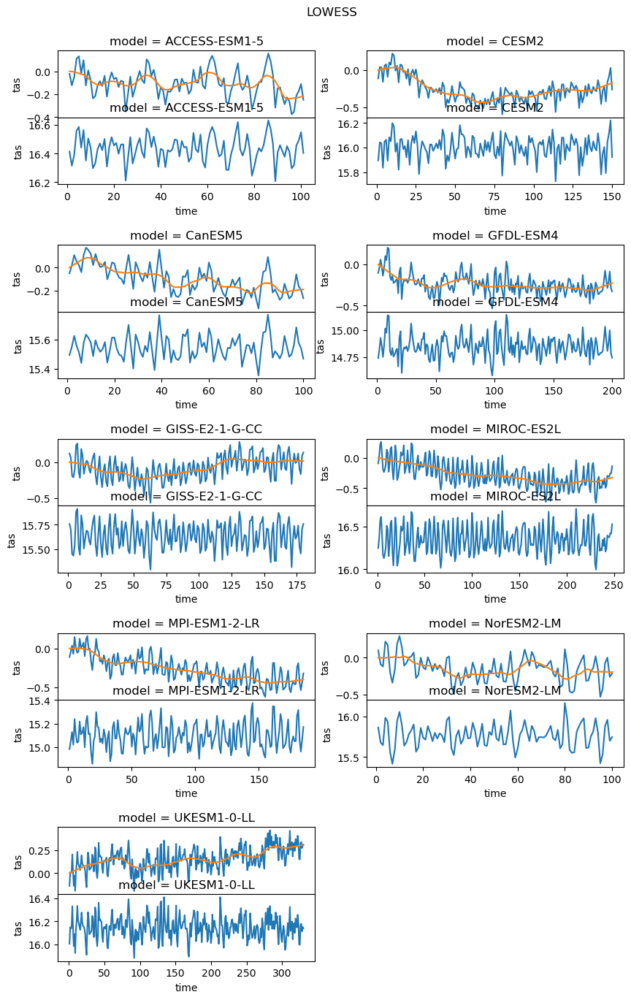

In [185]:
fig = plt.figure(figsize=(10, 30))
outer_gs = gridspec.GridSpec(len(models),2, hspace=0.45)

for num, model in enumerate(models):
    innter_gs = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=outer_gs[num], hspace=0)

    ax_top = fig.add_subplot(innter_gs[0])
    ax_bottom = fig.add_subplot(innter_gs[1])

    a1_smean_anom_ds.sel(model=model).plot(ax=ax_top, label='Raw')
    a1_smean_anom_trendfit_lowess_ds.sel(model=model).plot(ax=ax_top, label='Trend Fit')
    a1_smean_anom_detrend_lowess_ds.sel(model=model).plot(ax=ax_bottom, label='Detrended')

fig.suptitle('LOWESS', y=0.9);

Text(0.5, 0.9, 'POLYNOMIAL')

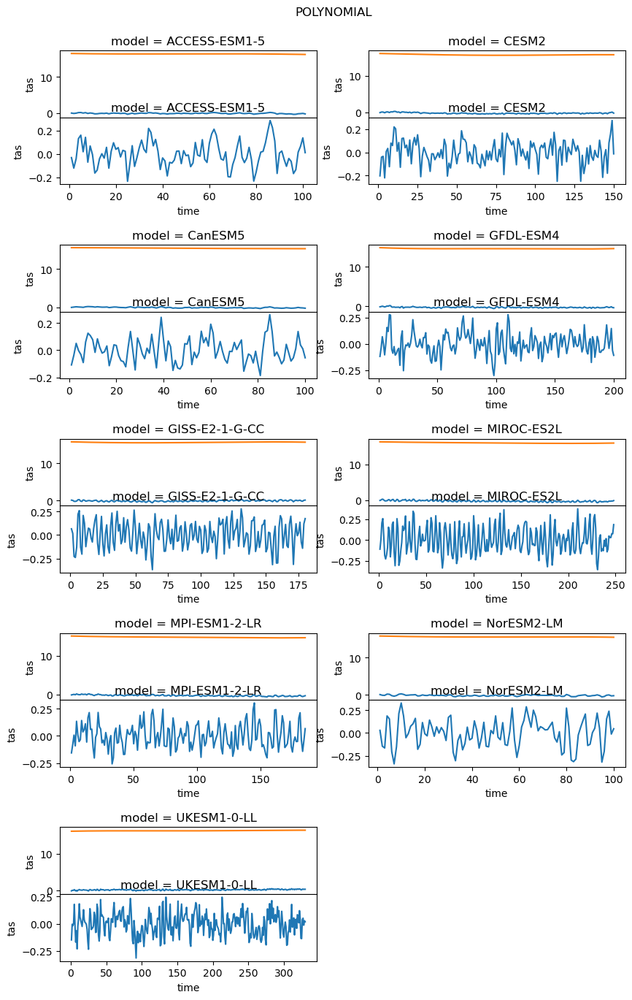

In [186]:
fig = plt.figure(figsize=(10, 30))
outer_gs = gridspec.GridSpec(len(models),2, hspace=0.45)

for num, model in enumerate(models):
    innter_gs = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=outer_gs[num], hspace=0)

    ax_top = fig.add_subplot(innter_gs[0])
    ax_bottom = fig.add_subplot(innter_gs[1])

    a1_smean_anom_ds.sel(model=model).plot(ax=ax_top, label='Raw')
    a1_smean_anom_trendfit_poly_ds.sel(model=model).plot(ax=ax_top, label='Trend Fit')
    a1_smean_anom_detrend_poly_ds.sel(model=model).plot(ax=ax_bottom, label='Detrended')

fig.suptitle('POLYNOMIAL', y=0.9)

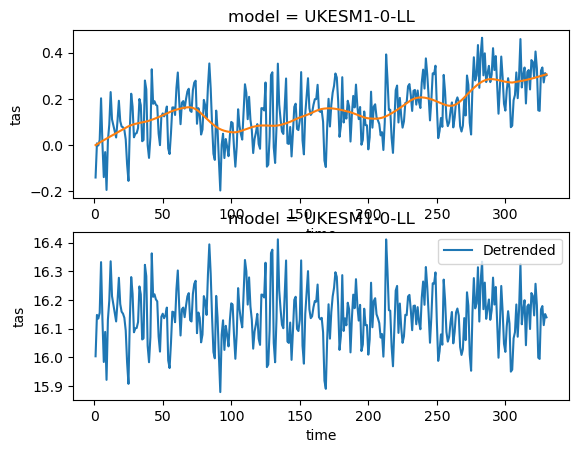

In [187]:
model = 'UKESM1-0-LL'#'CanESM5'#'CESM2'

fig, (ax1, ax2) = plt.subplots(2, 1)
a1_smean_anom_ds.sel(model=model).plot(ax=ax1, label='Raw')
a1_smean_anom_trendfit_ds.sel(model=model).plot(ax=ax1, label='Trend Fit')
a1_smean_anom_detrend_ds.sel(model=model).plot(ax=ax2, label='Detrended')
plt.legend()

## Single window checks S/N Ratio

In [188]:
reload(sn_calc)

<module 'signal_to_noise_calculations' from '/home/563/ab2313/Documents/zecmip_stabilisation/src/signal_to_noise_calculations.py'>

In [189]:
signal_rolling_ds, noise_rolling_ds, sn_ratio_test_rolling = sn_calc.signal_to_noise_ratio(
    a1_smean_anom_ds, 30, detrended_data=a1_smean_anom_detrend_ds, 
    noise_type='rolling', logginglevel='INFO', return_all=True)

- Calculating the rolling signal with method gradient
- noise_type='rolling'
- Calculting the rolling noise


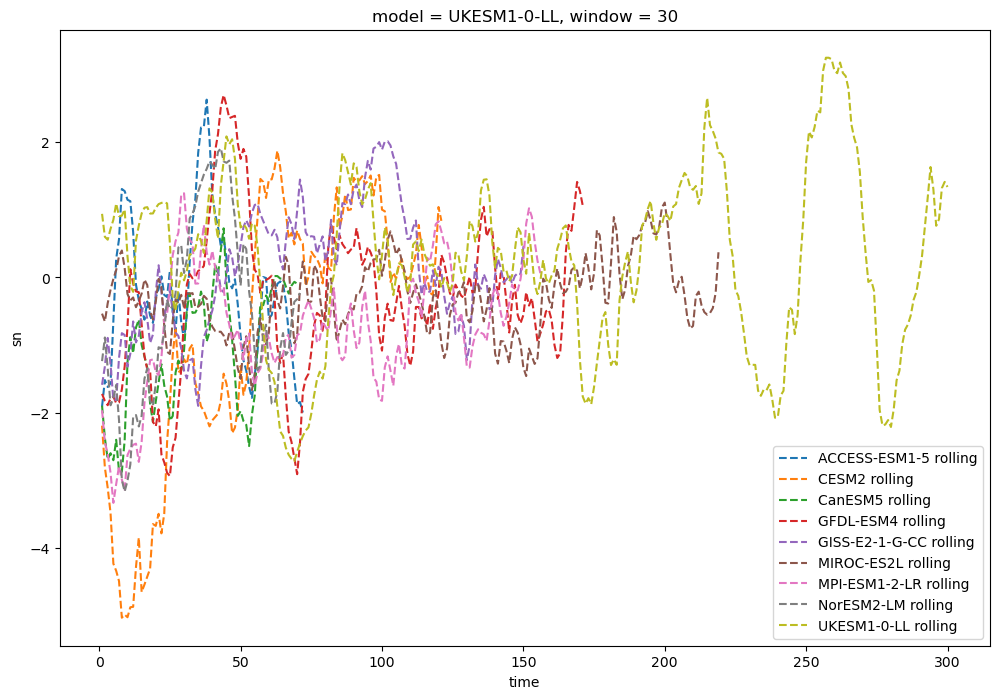

In [287]:
# Define a consistent color palette
models = sn_ratio_test_rolling.model.values
palette = sns.color_palette("tab10", n_colors=len(models))
color_dict = dict(zip(models, palette))

# Create the figure
fig, ax = plt.subplots(figsize=(12, 8))


# Plot the second dataset
for model in models:
    sn_ratio_test_rolling.sel(model=model).plot(ax=ax, color=color_dict[model], linestyle='--', label=f"{model} rolling")

# Add legend
ax.legend()

## S/N Ratio Calculation

In [192]:
# Information about the length of availabile time in each model
# and the recomended maximum window length (the length of time - the minimum window (10))/10
# NOTE: This has been added to constants.
model_window_information = {}
for model in a1_smean_anom_ds.model.values:
    time_length = len(a1_smean_anom_ds.sel(model=model).dropna(dim='time').time.values)
    max_window = int(np.ceil((time_length)/2.5))
    model_window_information[model] = {'time_length':time_length, 'max_window':max_window}
model_window_information['UKESM1-0-LL']['max_window'] = 201

In [193]:
for model in esmpi_smean_ds.model.values:
    lenght = len(esmpi_smean_ds.sel(model=model).dropna(dim='time').time.values)
    print(model, lenght)

ACCESS-ESM1-5 1000
CESM2 1200
CanESM5 1000
GFDL-ESM4 500
GISS-E2-1-G-CC 165
MIROC-ES2L 500
MPI-ESM1-2-LR 1000
NorESM2-LM 501
UKESM1-0-LL 1880


In [194]:
model_window_information

{'ACCESS-ESM1-5': {'time_length': 101, 'max_window': 41},
 'CESM2': {'time_length': 150, 'max_window': 60},
 'CanESM5': {'time_length': 100, 'max_window': 40},
 'GFDL-ESM4': {'time_length': 200, 'max_window': 80},
 'GISS-E2-1-G-CC': {'time_length': 180, 'max_window': 72},
 'MIROC-ES2L': {'time_length': 248, 'max_window': 100},
 'MPI-ESM1-2-LR': {'time_length': 185, 'max_window': 74},
 'NorESM2-LM': {'time_length': 100, 'max_window': 40},
 'UKESM1-0-LL': {'time_length': 330, 'max_window': 201}}

In [195]:
max_window = np.max(list(map(lambda info: info['max_window'], model_window_information.values())))
max_window

201

In [196]:
# windows = np.arange(10, max_window, 1)
windows = np.arange(10, 201)
#np.arange(**constants.ZECMIP_MULTI_WINDOW_PARAMS)
windows

array([ 10,  11,  12,  13,  14,  15,  16,  17,  18,  19,  20,  21,  22,
        23,  24,  25,  26,  27,  28,  29,  30,  31,  32,  33,  34,  35,
        36,  37,  38,  39,  40,  41,  42,  43,  44,  45,  46,  47,  48,
        49,  50,  51,  52,  53,  54,  55,  56,  57,  58,  59,  60,  61,
        62,  63,  64,  65,  66,  67,  68,  69,  70,  71,  72,  73,  74,
        75,  76,  77,  78,  79,  80,  81,  82,  83,  84,  85,  86,  87,
        88,  89,  90,  91,  92,  93,  94,  95,  96,  97,  98,  99, 100,
       101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113,
       114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126,
       127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139,
       140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152,
       153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165,
       166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178,
       179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 19

In [197]:
# Params to use for both
SN_PARAMS = dict(return_all=True, center=True, return_control=True, logginglevel='ERROR')

In [198]:
SN_RATIO_KWARGS = dict(parallel=True,logginglevel='ERROR')

In [200]:
# # Calculate the S/R ratio for the A1 experiment. This noise should be the detrended data
signal_multi_rolling_da = sn_calc.multi_window_func(
    sn_calc.rolling_signal,
    a1_smean_anom_ds,
    windows,
    start_align=False,
    # min_periods='half',
    **SN_RATIO_KWARGS
)

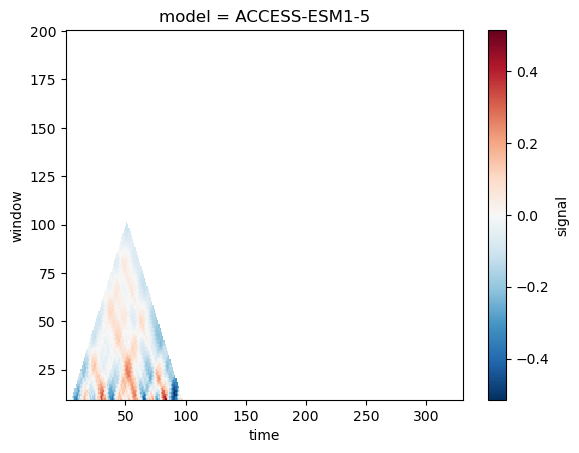

In [201]:
signal_multi_rolling_da.sel(model='ACCESS-ESM1-5').plot(y='window')

In [202]:
# # Calculate the S/R ratio for the A1 experiment. This noise should be the detrended data
noise_multi_rolling_da = sn_calc.multi_window_func(
    sn_calc.rolling_noise, a1_smean_anom_ds, windows, start_align=False,
    **SN_RATIO_KWARGS
)

In [203]:
# # Calculate the S/R ratio for the A1 experiment. This noise should be the detrended data
sn_multi_rolling_da = sn_calc.signal_to_noise_ratio_multi_window(
    a1_smean_anom_ds, windows,
    detrended_data=a1_smean_anom_detrend_ds,
    start_align=False,
    noise_type='rolling',
    # min_periods='half',
    **SN_RATIO_KWARGS
)

In [205]:
sn_multi_rolling_control_ds = sn_calc.signal_to_noise_ratio_multi_window(
    esmpi_smean_ds, windows, noise_type='rolling', start_align=False, **SN_RATIO_KWARGS
)

sn_multi_rolling_control_ds.name = 'signal_to_noise'

In [206]:
# The bounds from the pi-controls
rolling_bounds = sn_calc.upper_and_lower_bounds(sn_multi_rolling_control_ds, 1, 99)

In [207]:
# Mergine togeth with the bounds (more of a legacy need)
# Drop nan here, or some windows can be longer than others
sn_multi_rolling_ds = xr.merge([sn_multi_rolling_da.to_dataset(), rolling_bounds])

In [208]:
sn_multi_rolling_ds

<xarray.Dataset> Size: 5MB
Dimensions:      (model: 9, time: 330, window: 191)
Coordinates:
  * model        (model) <U14 504B 'ACCESS-ESM1-5' 'CESM2' ... 'UKESM1-0-LL'
  * time         (time) int64 3kB 1 2 3 4 5 6 7 ... 324 325 326 327 328 329 330
  * window       (window) int64 2kB 10 11 12 13 14 15 ... 196 197 198 199 200
Data variables:
    sn           (window, model, time) float64 5MB nan nan nan ... nan nan nan
    lower_bound  (window, model) float64 14kB -2.996 -2.896 ... -1.156 -2.063
    upper_bound  (window, model) float64 14kB 2.98 2.951 3.034 ... 1.227 1.642

In [209]:
# Just the unstalgbe points - both xrlist and ds
above_or_below_kwargs = dict(main_var='sn', greater_than_var='upper_bound', less_than_var='lower_bound')

unstable_rolling_ds = sn_multi_rolling_ds.utils.above_or_below(**above_or_below_kwargs)

In [210]:
# For each window get the number of years that are stable forn each point in time
# Note, these are nnot used much. 
decreasing_ds = xr.where(unstable_rolling_ds < 0, 1, 0)
increasing_ds = xr.where(unstable_rolling_ds > 0, 1, 0)

## Stabilisation Detection

In [211]:
windows = unstable_rolling_ds.window.values
windows

array([ 10,  11,  12,  13,  14,  15,  16,  17,  18,  19,  20,  21,  22,
        23,  24,  25,  26,  27,  28,  29,  30,  31,  32,  33,  34,  35,
        36,  37,  38,  39,  40,  41,  42,  43,  44,  45,  46,  47,  48,
        49,  50,  51,  52,  53,  54,  55,  56,  57,  58,  59,  60,  61,
        62,  63,  64,  65,  66,  67,  68,  69,  70,  71,  72,  73,  74,
        75,  76,  77,  78,  79,  80,  81,  82,  83,  84,  85,  86,  87,
        88,  89,  90,  91,  92,  93,  94,  95,  96,  97,  98,  99, 100,
       101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113,
       114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126,
       127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139,
       140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152,
       153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165,
       166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178,
       179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 19

### Sample Calculation

In [212]:
model = 'MPI-ESM1-2-LR'#'ACCESS-ESM1-5'#'GISS-E2-1-G-CC'#'GFDL-ESM4'#
unstable_rolling_ds_model = unstable_rolling_ds.sel(model=model)

unstable_rolling_ds_model = unstable_rolling_ds_model.sel(
    window=slice(None, model_window_information[model]['max_window']))
model_windows = unstable_rolling_ds_model.window.values

unstable_rolling_ds_model = xr.where(np.isfinite(unstable_rolling_ds_model), 1, 0).sn

max_val = model_window_information[model]['time_length']- 11
print(model,model_windows)

MPI-ESM1-2-LR [10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33
 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57
 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73 74]


In [213]:
unstable_frac_model_da = xr.apply_ufunc(
    sn_calc.frac_non_zero,
    unstable_rolling_ds_model, 
    input_core_dims=[['time']],
    output_core_dims=[['time']],
    vectorize=True,
    kwargs = {'period_length': 10}
)

In [214]:
unstable_frac_threshold_model_da = (unstable_frac_model_da>=.5)

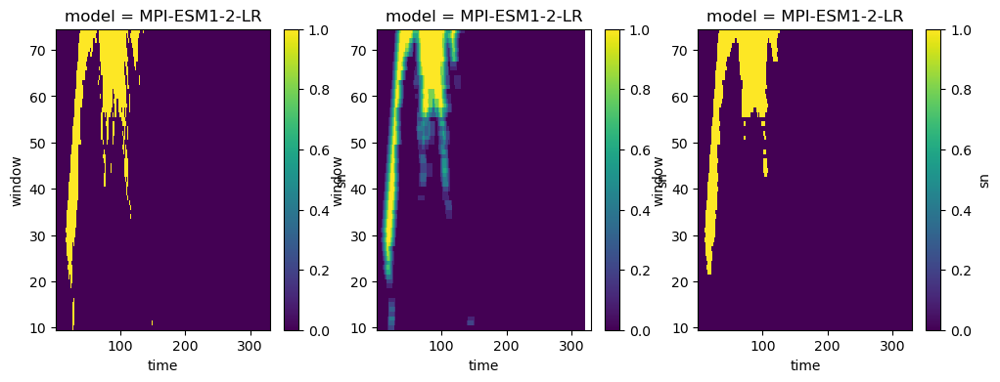

In [215]:
fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize=(12, 4))
unstable_rolling_ds_model.plot(y='window', ax=ax1)
unstable_frac_model_da.plot(y='window', ax=ax2)
unstable_frac_threshold_model_da.plot(y='window', ax=ax3)

### Full Calculation

In [216]:
# Sample of applying the stabilisation detection to a single model

number_attempts = 9

year_stable_and_unstable_model_ds = xr.apply_ufunc(
    sn_calc.calcuate_year_stable_and_unstable,
    unstable_rolling_ds_model.transpose(*['time', 'window']),
    unstable_frac_threshold_model_da.transpose(*['time', 'window']),
    input_core_dims=[['time', 'window'], ['time', 'window']],
    output_core_dims=[['stability_index']],
    dask_gufunc_kwargs={'output_sizes': {'stability_index': number_attempts}},
    vectorize=True,
    kwargs={'max_val': max_val, 'windows':model_windows, 'period_length': 20,
            'number_attempts':number_attempts, 'logginglevel':'DEBUG'}
)

- period_length=20
- Shapes - time_window_arr = (330, 65), frac_unstable_arr = (330, 65)
- initial_fracs shape (20, 65)
-  - inital_fracs (shape = (20, 65))
[[False False False False False False False False False False False False
  False False False False False False False False False False False False
  False False False False False False False False False False False False
  False False False False False False False False False False False False
  False False False False False False False False False False False False
  False False False False False]
 [False False False False False False False False False False False False
  False False False False False False False False False False False False
  False False False False False False False False False False False False
  False False False False False False False False False False False False
  False False False False False False False False False False False False
  False False False False False]
 [False False False False False False

In [217]:
year_stable_and_unstable_model_ds

<xarray.DataArray 'sn' (stability_index: 9)> Size: 72B
136.0 nan nan nan nan nan nan nan nan
Coordinates:
    model    <U14 56B 'MPI-ESM1-2-LR'
Dimensions without coordinates: stability_index

In [218]:
## The year stable and unstalbe not must be done seperatly per model, 
### this is becuase the windows is now different depending on the model.
number_attempts = 9
period_length = 10

year_stable_and_unstable_model_list = []
for model in unstable_rolling_ds.model.values:
    unstable_rolling_ds_model = unstable_rolling_ds.sel(model=model).sel(
        window=slice(None, model_window_information[model]['max_window'])).sn

    unstable_rolling_ds_model = xr.where(np.isfinite(unstable_rolling_ds_model), 1, 0)
    
    unstable_frac_model_da = xr.apply_ufunc(
        sn_calc.frac_non_zero,
        unstable_rolling_ds_model, 
        input_core_dims=[['time']],
        output_core_dims=[['time']],
        vectorize=True,
        kwargs = {'period_length': period_length}
    )
    
    model_windows = unstable_rolling_ds_model.window.values


    max_val = model_window_information[model]['time_length']- 11
    print(model,model_windows)
    
    year_stable_and_unstable_model_ds = xr.apply_ufunc(
        sn_calc.calcuate_year_stable_and_unstable,
        unstable_rolling_ds_model.transpose(*['time', 'window']),
        unstable_frac_model_da.transpose(*['time', 'window']),
        input_core_dims=[['time', 'window'], ['time', 'window']],
        output_core_dims=[['stability_index']],
        dask_gufunc_kwargs={'output_sizes': {'stability_index': number_attempts}},
        vectorize=True,
        kwargs={'max_val': max_val, 'windows':model_windows, 'period_length': period_length,
                'number_attempts':number_attempts, 'logginglevel':'ERROR'}
    )
    year_stable_and_unstable_model_ds=year_stable_and_unstable_model_ds.assign_coords(
        stability_index=np.arange(1, number_attempts+1))
    
    year_stable_and_unstable_model_ds.attrs['Stability index'] ='Odd values mean stable, even mean unstable'

    year_stable_and_unstable_model_list.append(year_stable_and_unstable_model_ds)

year_stable_and_unstable_rolling_ds = xr.concat(year_stable_and_unstable_model_list, dim='model')

ACCESS-ESM1-5 [10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33
 34 35 36 37 38 39 40 41]
CESM2 [10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33
 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57
 58 59 60]
CanESM5 [10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33
 34 35 36 37 38 39 40]
GFDL-ESM4 [10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33
 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57
 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80]
GISS-E2-1-G-CC [10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33
 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57
 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72]
MIROC-ES2L [ 10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27
  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45
  46  47  48  49  50  51  52

In [219]:
year_stable_and_unstable_rolling_ds

<xarray.DataArray 'sn' (model: 9, stability_index: 9)> Size: 648B
0.0 30.0 41.0 50.0 55.0 81.0 90.0 nan ... 77.0 90.0 183.0 282.0 nan nan nan nan
Coordinates:
  * model            (model) <U14 504B 'ACCESS-ESM1-5' 'CESM2' ... 'UKESM1-0-LL'
  * stability_index  (stability_index) int64 72B 1 2 3 4 5 6 7 8 9
Attributes:
    Stability index:  Odd values mean stable, even mean unstable

In [220]:
sn_rolling_nan_locs = np.isnan(sn_multi_rolling_da)

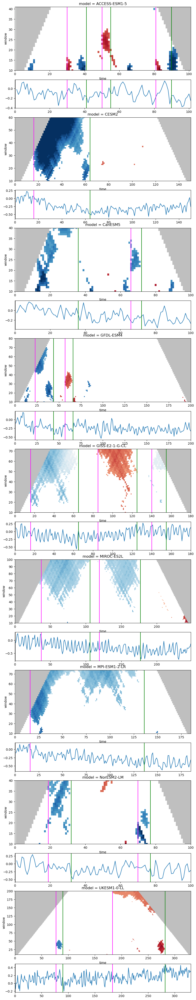

In [221]:
fig = plt.figure(figsize=(10, 45*1.25))
gs = gridspec.GridSpec(18,1, height_ratios=[1, 0.45]*9)
axes = [fig.add_subplot(gs[i]) for i in range(18)]

colors = ['green', 'magenta']
for mnum, num in enumerate(np.arange(0, 18, 2)):
    ax = axes[num]
    ax2 = axes[num+1]
    model = models[mnum]
    
    unstable_rolling_ds.sel(model=model).sn.plot(
        y='window', ax=ax, cmap='RdBu_r', levels=np.arange(-4, 4.25, .25), add_colorbar=False)

    sn_plotting.grey_mask(ax,sn_rolling_nan_locs.sel(model=model))
    
    a1_model_ds = a1_smean_anom_ds.sel(model=model)
    ax2.plot(a1_model_ds.time.values, a1_model_ds.values)
    for num,year in enumerate(year_stable_and_unstable_rolling_ds.sel(model=model).values):
        ax.axvline(year, c=colors[num%2])
        ax2.axvline(year, c=colors[num%2])

    # ax.axvspan(model_max_vals[model]-half_window, model_max_vals[model], color='grey')
    # ax.axvspan(-half_window, 0, color='grey')
    ax2.axvline(0, color='k', linewidth=3)
    

    ax.set_xlim(0,model_window_information[model]['time_length'])
    ax2.set_xlim(0,model_window_information[model]['time_length'])
    ax.set_ylim(10, model_window_information[model]['max_window'] if 'UKESM' not in model else 200)

## Processing
Misc things for formatting

In [222]:
rolling_year_stable_ds = year_stable_and_unstable_rolling_ds.sel(stability_index=1) #total_stable_year_da_rolling

In [223]:
rolling_year_stable_ds=rolling_year_stable_ds.to_dataset(name='time')

In [224]:
rolling_year_stable_ds

<xarray.Dataset> Size: 584B
Dimensions:          (model: 9)
Coordinates:
  * model            (model) <U14 504B 'ACCESS-ESM1-5' 'CESM2' ... 'UKESM1-0-LL'
    stability_index  int64 8B 1
Data variables:
    time             (model) float64 72B 0.0 0.0 36.0 0.0 0.0 0.0 0.0 0.0 0.0

## Temperature Anomalies

In [225]:
year_stable_and_unstable_rolling_ds.stability_index.values[::2]

array([1, 3, 5, 7, 9])

In [226]:
utils.change_logginglevel('DEBUG')

# Initialize results dictionary
year_of_stabilisation_dict = {}

# Iterate over each model
for model in year_stable_and_unstable_rolling_ds.model.values:
    logger.info(model)
    model_dict = {}
    
    # Retrieve zec50 and year values
    zec50_val = zec50_ds.sel(model=model).values.item()
    model_dict['zec50'] = zec50_val
    year_vals = year_stable_and_unstable_rolling_ds.sel(model=model).values
    temps_vals = a1_smean_anom_trendfit_ds.sel(model=model).dropna(dim='time').values
    logger.info(f'{year_vals=}')

    for i, yeari in enumerate(year_vals):
        if np.isnan(yeari):
            model_dict[f'stable_{i}'] = np.nan
            break

        yeari = int(yeari)
        label = f'stable_period_temp_av_{i}' if i % 2 == 0 else f'unstable_period_temp_change_{i}'
        temp_type = 'stable' if i % 2 == 0 else 'unstable'

        if temp_type == 'stable':
            temp = temps_vals[yeari]
        else:
            unstable_start_year = yeari
            next_stable_start = int(year_vals[i + 1])
            temp = temps_vals[next_stable_start] - temps_vals[unstable_start_year]

        model_dict[f'{temp_type}_{i}'] = yeari
        model_dict[label] = temp
        model_dict['zec50-final'] = np.round(zec50_val - temp, 2)
        model_dict['final_temp'] = temp

        # Retrieve max stability index for stable periods only
        model_dict['final_year_stable'] = (year_stable_and_unstable_rolling_ds
                                           .sel(stability_index=year_stable_and_unstable_rolling_ds.stability_index.values[::2], model=model)
                                           .max(dim='stability_index')).values

    year_of_stabilisation_dict[model] = model_dict

# Create DataFrame, drop NaNs, reorder columns
year_of_stabilisation_df = pd.DataFrame(year_of_stabilisation_dict).transpose()
year_of_stabilisation_df.dropna(axis=1, how='all', inplace=True)

# Set column order and rounding
order_start = ['zec50', 'final_temp', 'zec50-final', 'final_year_stable']
remaining_cols = [col for col in year_of_stabilisation_df.columns if col not in order_start]
year_of_stabilisation_df = year_of_stabilisation_df[order_start + remaining_cols]
year_of_stabilisation_df = year_of_stabilisation_df.round(2)
year_of_stabilisation_df.index.name = 'model'


- ACCESS-ESM1-5
- year_vals=array([ 0., 30., 41., 50., 55., 81., 90., nan, nan])
- CESM2
- year_vals=array([ 0., 16., 64., nan, nan, nan, nan, nan, nan])
- CanESM5
- year_vals=array([36., 66., 72., nan, nan, nan, nan, nan, nan])
- GFDL-ESM4
- year_vals=array([ 0., 23., 44., 57., 66., nan, nan, nan, nan])
- GISS-E2-1-G-CC
- year_vals=array([  0.,  16.,  65.,  85., 125., 140., 155.,  nan,  nan])
- MIROC-ES2L
- year_vals=array([  0.,  37., 106., 119., 177.,  nan,  nan,  nan,  nan])
- MPI-ESM1-2-LR
- year_vals=array([  0.,  16., 136.,  nan,  nan,  nan,  nan,  nan,  nan])
- NorESM2-LM
- year_vals=array([ 0., 19., 32., 70., 77., nan, nan, nan, nan])
- UKESM1-0-LL
- year_vals=array([  0.,  77.,  90., 183., 282.,  nan,  nan,  nan,  nan])


In [227]:
model='UKESM1-0-LL'

In [228]:
year_stable_and_unstable_rolling_ds.sel(model=model).values

array([  0.,  77.,  90., 183., 282.,  nan,  nan,  nan,  nan])

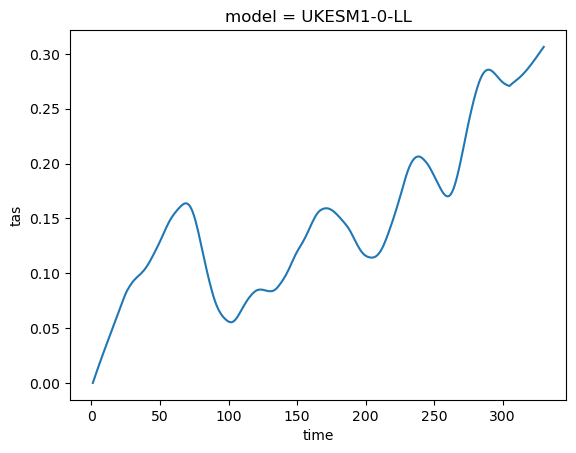

In [229]:
a1_smean_anom_trendfit_ds.sel(model=model).plot()

In [230]:
# DATA_DIR = os.getcwd() + '/Documents/zecmip_stabilisation/data'
# os.path.join(DATA_DIR, 'model_gsmt_stabilisation.csv')
# year_of_stabilisation_df.to_csv(os.path.join(DATA_DIR, 'model_gsmt_stabilisation_v2.csv'))

In [231]:
print(year_of_stabilisation_df[['final_year_stable', 'final_temp', 'zec50',  'zec50-final']])

               final_year_stable final_temp     zec50 zec50-final
model                                                            
ACCESS-ESM1-5               90.0  -0.162591  0.011263        0.17
CESM2                       64.0  -0.431623 -0.309432        0.12
CanESM5                     72.0  -0.178816 -0.101714        0.08
GFDL-ESM4                   66.0  -0.194141 -0.205462       -0.01
GISS-E2-1-G-CC             155.0  -0.003119 -0.090054       -0.09
MIROC-ES2L                 177.0  -0.431971 -0.108684        0.32
MPI-ESM1-2-LR              136.0  -0.375268 -0.270157        0.11
NorESM2-LM                  77.0  -0.237884 -0.334373        -0.1
UKESM1-0-LL                282.0   0.274641  0.289212        0.01


In [232]:
cooling_models = ['MPI-ESM1-2-LR', 'CESM2', 'CanESM5', 'GFDL-ESM4', 'GISS-E2-1-G-CC', 'NorESM2-LM']

In [233]:
year_of_stabilisation_df.loc[cooling_models].mean(axis=0)

zec50                            -0.218532
final_temp                       -0.236809
zec50-final                       0.018333
final_year_stable                     95.0
stable_0                               6.0
stable_period_temp_av_0          -0.009472
unstable_1                            26.0
unstable_period_temp_change_1    -0.196244
stable_2                         68.833333
stable_period_temp_av_2          -0.286703
unstable_3                       70.666667
unstable_period_temp_change_3     0.036577
stable_4                         89.333333
stable_period_temp_av_4          -0.130288
unstable_5                           140.0
unstable_period_temp_change_5    -0.023911
stable_6                             155.0
stable_period_temp_av_6          -0.003119
dtype: object

In [234]:
year_of_stabilisation_df.median(axis=0)

zec50                           -0.108684
final_temp                      -0.194141
zec50-final                          0.08
final_year_stable                    90.0
stable_0                              0.0
stable_period_temp_av_0               0.0
unstable_1                           23.0
unstable_period_temp_change_1   -0.143711
stable_2                             65.0
stable_period_temp_av_2         -0.245935
unstable_3                           77.5
unstable_period_temp_change_3    0.042082
stable_4                            101.0
stable_period_temp_av_4         -0.134326
unstable_5                          110.5
unstable_period_temp_change_5   -0.044026
stable_6                            122.5
stable_period_temp_av_6         -0.082855
dtype: object

In [235]:
year_of_stabilisation_df.mean(axis=0)

zec50                             -0.124378
final_temp                        -0.193419
zec50-final                        0.067778
final_year_stable                124.333333
stable_0                                4.0
stable_period_temp_av_0           -0.006315
unstable_1                        33.333333
unstable_period_temp_change_1     -0.171263
stable_2                          72.222222
stable_period_temp_av_2           -0.234729
unstable_3                             94.0
unstable_period_temp_change_3      0.021681
stable_4                         130.333333
stable_period_temp_av_4           -0.103784
unstable_5                            110.5
unstable_period_temp_change_5     -0.044026
stable_6                              122.5
stable_period_temp_av_6           -0.082855
dtype: object

# <h1 style="color: Green; font-size: 32px;"> Quick Verification(h1)</h1>

- locator: <matplotlib.ticker.AutoLocator object at 0x1503ab78afe0>


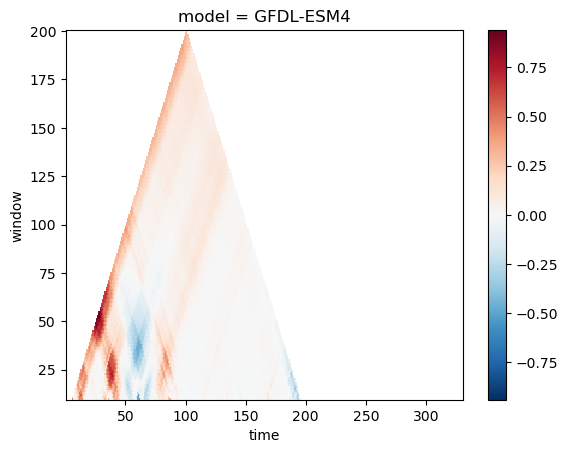

In [236]:
((signal_multi_rolling_da/noise_multi_rolling_da).isel(model=3)-sn_multi_rolling_da.isel(model=3)).plot()

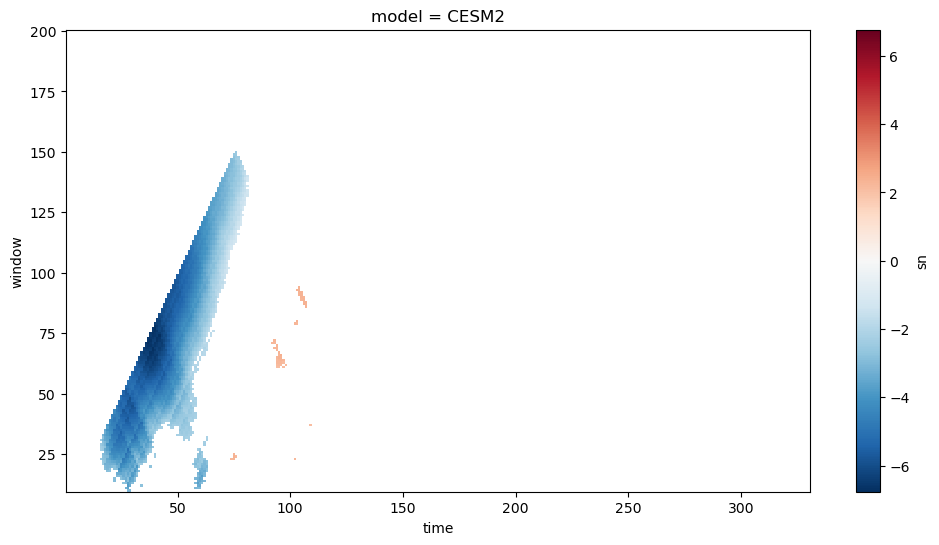

In [285]:
imodel = 1
fig = plt.figure(figsize=(12, 6))
unstable_rolling_ds.isel(model=imodel).sn.plot(y='window')

- locator: <matplotlib.ticker.AutoLocator object at 0x1503d4682a70>


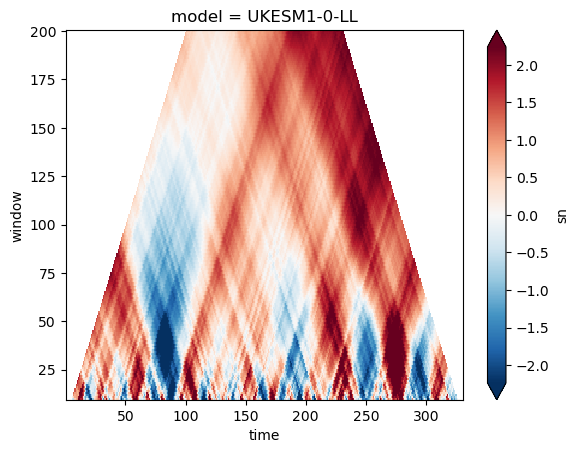

In [238]:
sn_multi_rolling_ds.sel(model='UKESM1-0-LL').sn.plot(robust=True)

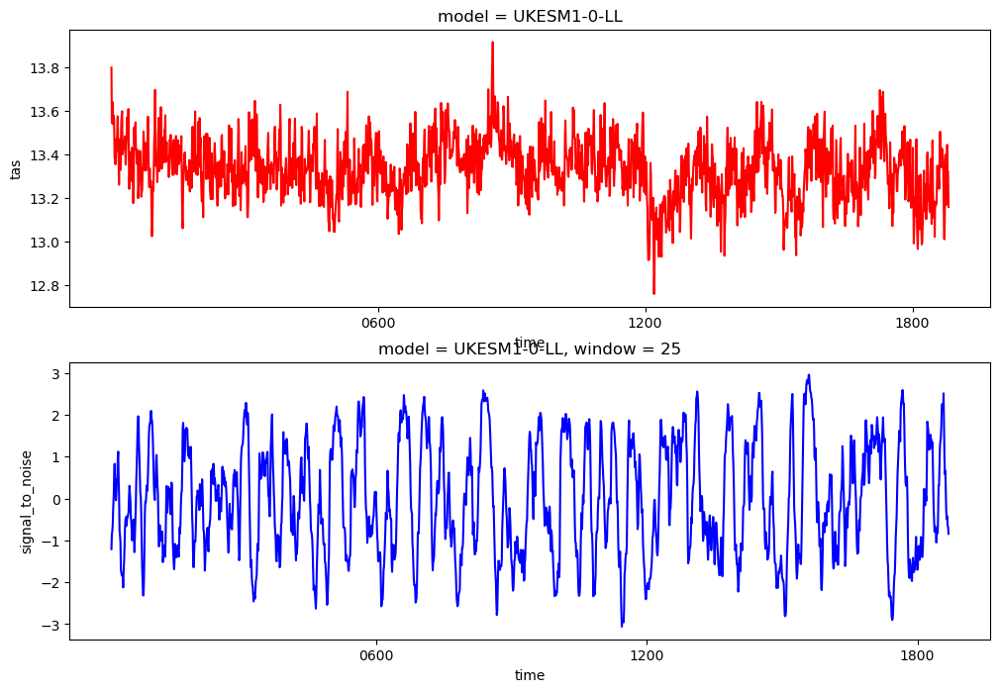

In [239]:
fig, (ax, ax2) = plt.subplots(2, 1,figsize=(12, 8))
# ax2 = ax.twinx()
esmpi_smean_ds.sel(model='UKESM1-0-LL').plot(ax=ax, color='red')
sn_multi_rolling_control_ds.sel(model='UKESM1-0-LL', window=25).plot(ax=ax2, color='blue')

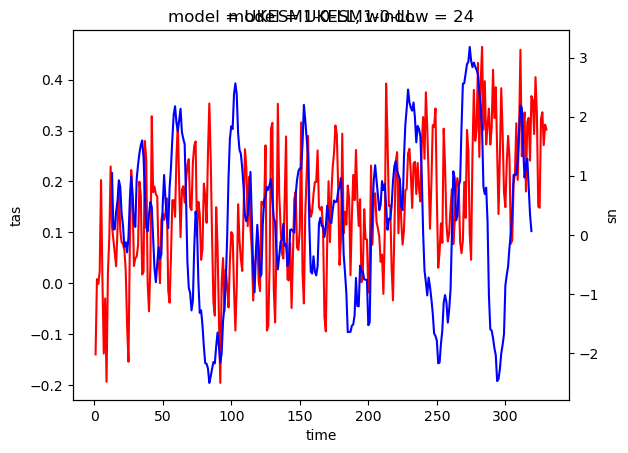

In [240]:
fig, ax = plt.subplots()
ax2 = ax.twinx()
a1_smean_anom_ds.sel(model='UKESM1-0-LL').plot(ax=ax, color='red')
sn_multi_rolling_ds.sn.sel(model='UKESM1-0-LL', window=24).plot(ax=ax2, color='blue')

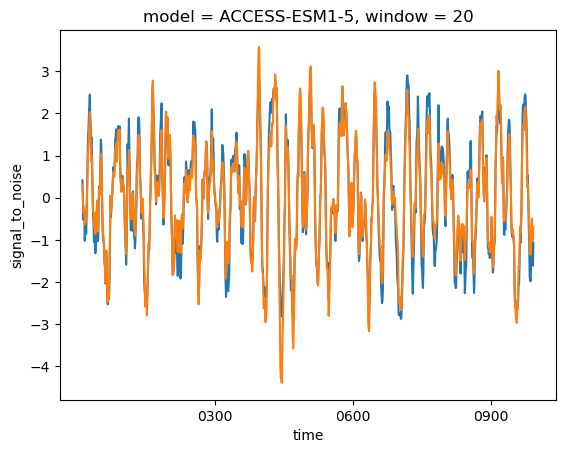

In [241]:
sn_multi_rolling_control_ds.isel(model=0, window=10).plot()

- locator: <matplotlib.ticker.AutoLocator object at 0x1503d43effd0>


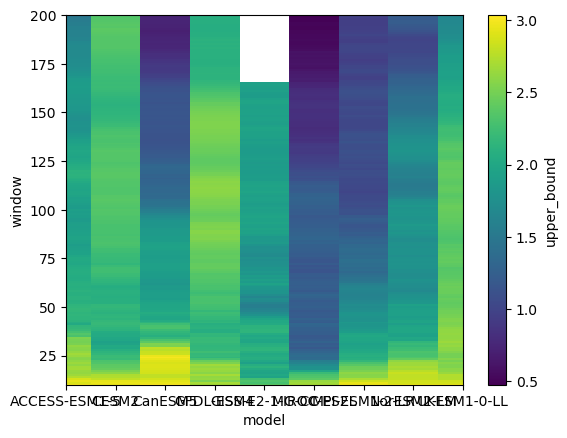

In [242]:
rolling_bounds.upper_bound.plot()

# <h1 style="color: Green; font-size: 32px;"> Plots (h1)</h1>

## Set-up

In [244]:
units =  r'$^{\circ}C$'

In [245]:
def format_null_axis(ax):
    '''
    Axis that doesn't have any spines, or y tick labels or locaionts
    '''
    [ax.spines[sp].set_visible(False) for sp in ['top', 'left', 'right']]
    ax.set_yticks([])
    ax.set_yticklabels([])
    ax.set_title('')
    ax.set_ylabel('')

In [246]:
#### Note, this dictionary has also been put into constants as ZECMIP_MODEL_COLORS

# Create a list of models and their corresponding values
model_values = [(model, zec50_ds.sel(model=model).values.round(3)) for model in zec50_ds.model.values]

# Separate negative and positive values
negative_values = [(model, value) for model, value in model_values if value < 0]
positive_values = [(model, value) for model, value in model_values if value > 0]

# Sort the values by their absolute magnitude
negative_values.sort(key=lambda x: abs(x[1]))
positive_values.sort(key=lambda x: abs(x[1]))

# Create a colormap for negative values (BuPu_r) and positive values (OrRd)
# For the Blues we want to remove the three lower values there are too hard to see.  For the reds, just make sure it
# isn't the lower values. 
cut1 = 2
negative_colors = blue_colors = [
    '#add8e6',  # Light Blue
    '#87ceeb',  # Sky Blue
    '#6495ed',  # Cornflower Blue
    '#4169e1',  # Royal Blue
    '#1e90ff',  # Dodger Blue
    '#0000cd',  # Medium Blue
    '#00008b'   # Dark Blue
]
negative_line_styles = [
    '-',                # Solid
    '--',               # Dashed
    '-.',               # Dash-dot
    ':',                # Dotted
    '-',       # More frequent dashes, shorter space
    (0, (1, 1)),        # Densely dotted
    (0, (5, 1, 1, 1)),  # Dash, dot, dot, dot
]


#['#add8e6', '#87cefa', '#6495ed', '#4169e1', '#0000ff']#plt.cm.get_cmap('BuPu_r', len(negative_values)+cut1)(np.arange(len(negative_values)+cut1))[:-cut1]
positive_colors = plt.cm.get_cmap('OrRd', len(positive_values)+4)(np.arange(len(positive_values)+4))[::2][-2:]

# Create dictionaries for negative and positive values with color information
negative_zec50 = {model: {'value': value, 'color': color, 'linestyle':linestyle} for (model, value), color, linestyle in zip(negative_values, negative_colors, negative_line_styles)}
positive_zec50 = {model: {'value': value, 'color': color} for (model, value), color in zip(positive_values, positive_colors)}

# Combine the dictionaries into the final zec50_dict
zec50_dict = {**negative_zec50, **positive_zec50}
zec50_dict

{'GISS-E2-1-G-CC': {'value': -0.09, 'color': '#add8e6', 'linestyle': '-'},
 'CanESM5': {'value': -0.102, 'color': '#87ceeb', 'linestyle': '--'},
 'MIROC-ES2L': {'value': -0.109, 'color': '#6495ed', 'linestyle': '-.'},
 'GFDL-ESM4': {'value': -0.205, 'color': '#4169e1', 'linestyle': ':'},
 'MPI-ESM1-2-LR': {'value': -0.27, 'color': '#1e90ff', 'linestyle': '-'},
 'CESM2': {'value': -0.309, 'color': '#0000cd', 'linestyle': (0, (1, 1))},
 'NorESM2-LM': {'value': -0.334,
  'color': '#00008b',
  'linestyle': (0, (5, 1, 1, 1))},
 'ACCESS-ESM1-5': {'value': 0.011, 'color': array([0.99, 0.7 , 0.48, 1.  ])},
 'UKESM1-0-LL': {'value': 0.289, 'color': array([0.79, 0.11, 0.07, 1.  ])}}

In [247]:
stability_colorplot_kwargs = dict(xlims=(0, 90), patch=False, ax2_ylabel='', ylabel='',
                                  cmap='RdBu_r', bbox_to_anchor=(1, 1.4), labelpad_left=65, labelpad_right=15, extend='both',
                                  cut_ticks=2, vmax=4, step=0.5,  font_scale=1.4, cbar_label='Signal-To-Noise Ratio', hspace=0.2,
                                  return_all=True, rotation=90)

In [248]:
models = np.sort(a1_smean_anom_ds.model.values)
models

array(['ACCESS-ESM1-5', 'CESM2', 'CanESM5', 'GFDL-ESM4', 'GISS-E2-1-G-CC',
       'MIROC-ES2L', 'MPI-ESM1-2-LR', 'NorESM2-LM', 'UKESM1-0-LL'],
      dtype='<U14')

## Figure 1 (Stability and each window)

In [341]:
# Final year stable for all models
final_year_stable = np.nanmax(year_stable_and_unstable_rolling_ds.values, axis=1)
final_year_stable

array([ 90.,  64.,  72.,  66., 155., 177., 136.,  77., 282.])

In [344]:
np.min(final_year_stable), np.max(final_year_stable)

(64.0, 282.0)

In [343]:
np.median(final_year_stable)

90.0

In [342]:
np.mean(final_year_stable)

124.33333333333333

In [249]:
line_colors = ['green', 'magenta']

In [250]:
stability_colorplot_kwargs = dict(xlims=(0, 90), patch=False, ax2_ylabel='', ylabel='',
                                  cmap='RdBu_r', bbox_to_anchor=(1, 1.4), labelpad_left=65, labelpad_right=15, extend='both',
                                  cut_ticks=2, vmax=4, step=0.5,  font_scale=1.4, cbar_label='Signal-To-Noise Ratio', hspace=0.2,
                                  return_all=True, rotation=90)

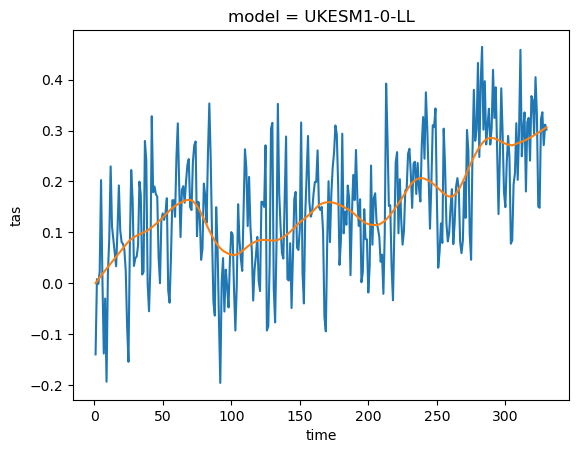

In [254]:
a1_smean_anom_ds.sel(model=model).plot()
a1_smean_anom_trendfit_ds.sel(model=model).plot()

- locator: <matplotlib.ticker.FixedLocator object at 0x150450192350>


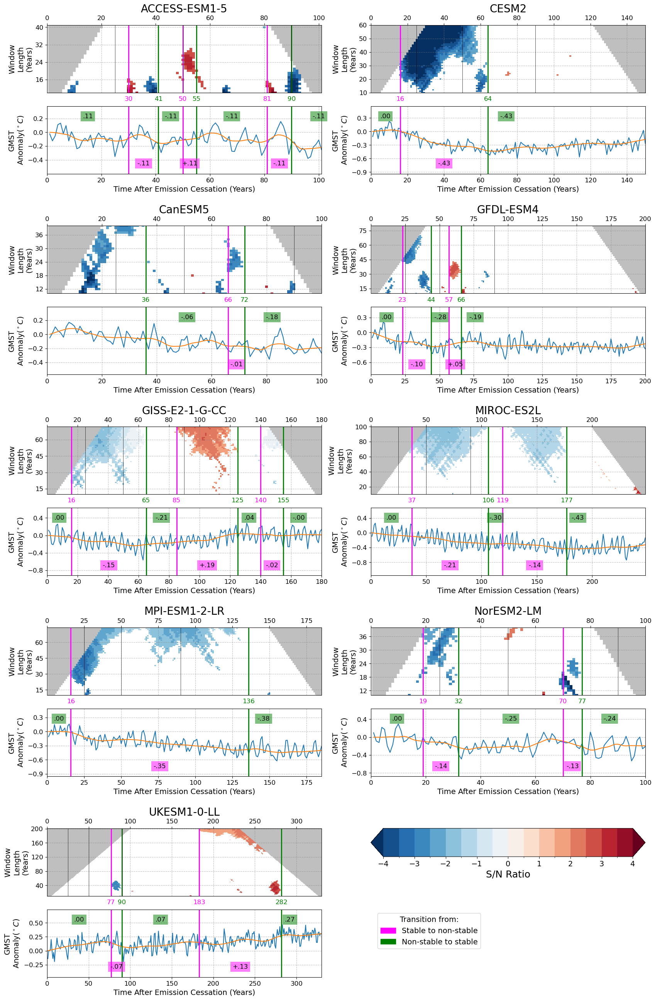

In [255]:

sn_ratio_levels = np.arange(-4, 4.5, .5)
fig = plt.figure(figsize=(20, 32))
outer_gs = gridspec.GridSpec(5, 2, hspace=0.35, wspace=0.18)

# Lists to store axes
upper_axes = []
lower_axes = []

# Loop through the grid positions
for i in range(5):
    for j in range(2):  # Loop over the two columns
        # Create a GridSpec for the inner plots (1 large and 1 small)

        if (i+1)*(j+1) <9: # Don't want the tench plot
            inner_gs = gridspec.GridSpecFromSubplotSpec(
                2, 1, subplot_spec=outer_gs[i, j], hspace=0.2,
                height_ratios=[1, 1])
            
            # Large plot (upper plot)
            upper_ax = fig.add_subplot(inner_gs[0])
            upper_axes.append(upper_ax)
            
            # Small plot (lower plot)
            lower_ax = fig.add_subplot(inner_gs[1])
            lower_axes.append(lower_ax)

models = np.sort(unstable_rolling_ds.model.values)

for num, model in enumerate(models):
    ax = upper_axes[num]
    ax_lower = lower_axes[num]

    cplot = unstable_rolling_ds.sel(model=model).sn.plot(
        y='window', ax=ax, cmap='RdBu_r', levels=sn_ratio_levels, 
        add_colorbar=False, extend='both')
    sn_plotting.grey_mask(ax,sn_rolling_nan_locs.sel(model=model))

    
    a1_model_ds = a1_smean_anom_ds.sel(model=model)
    ax_lower.plot(a1_model_ds.time.values, a1_model_ds.values)
    ax_lower.plot(a1_model_ds.time.values, a1_smean_anom_trendfit_ds.sel(model=model).values)
    # ax_lower.plot(a1_model_ds.time.values, a1_model_ds.rolling(time=20).mean().values,
    #          color='green')

    year_vals = year_stable_and_unstable_rolling_ds.sel(model=model).values
    year_vals = year_vals[np.isfinite(year_vals)].astype(int)
    # year_vals = year_vals[year_vals>0]

    
    for num in range(len(year_vals)):
        if num == len(year_vals)-1:
            # str_xloc = year_vals[num]+10
            str_xloc = year_vals[num] + 10
            #(model_window_information[model]['time_length'] + year_vals[num])/2
            yloc = 0.85
        elif not num%2:
            str_xloc = (year_vals[num]+year_vals[num+1])/2
            yloc = 0.85
        else:
            # str_xloc = year_vals[num+1]
            str_xloc = (year_vals[num]+year_vals[num+1])/2
            yloc = 0.15

        if not num%2: # Stable period
            temp = year_of_stabilisation_df.loc[model, f'stable_period_temp_av_{num}']
            # temp_str = f'T_av=\n{temp:.2f}'
            color = 'green'
        else:
            temp = year_of_stabilisation_df.loc[model, f'unstable_period_temp_change_{num}']
            # temp_str = f'delta T=\n{temp:.2f}'
            color = 'magenta'
        # temp_str = f'{temp:.2f}'
        sign = '+' if temp >= 0 else '-'  # Determine the sign
        if not num%2 and sign == '+':
            sign = ''

        # ACCESS doesn't become non-stable
        if 'ACCESS' in model:
            temp = np.nanmean(a1_smean_anom_ds.sel(model='ACCESS-ESM1-5').dropna('time').values).item()
            
        temp_str = f'{sign}.'+  f"{abs(temp):.2f}".split('.')[-1] 


        
        ax_lower.annotate(temp_str, xy=(str_xloc, yloc), xycoords=('data', 'axes fraction'),
                   fontsize=12, ha='center', va='center', 
                          bbox=dict(facecolor=color, edgecolor='none', alpha=0.5)
                          # color=color
                          )
            
    for num, year in enumerate(year_vals):

        # year_str = str(year)
        if 'UKESM' in model:
            if year == 270:
                year_loc = year-3
            elif year == 281:
                year_loc = year+3 
            else:
                year_loc = year
        elif 'GFDL' in model:
            if year == 59:
                year_loc = year-1
            elif year == 64:
                year_loc = year+1 
            else:
                year_loc = year
        else:
            year_loc = year

        if year != 0:
            ax.axvline(year, c=colors[num%2], linewidth=2)
            ax.annotate(year, xy=(year_loc, -0.05),
                xycoords=('data', 'axes fraction'),
                color=colors[num%2], fontsize=12, clip_on=False,
                ha='center', va='top')
  
            ax_lower.axvline(year, c=colors[num%2], linewidth=2)
        start_line = year

        
        if not num%2:
            temp = year_of_stabilisation_df.loc[model, f'stable_period_temp_av_{num}']
            if num == len(year_vals)-1 :
                end_line = start_line+20#model_window_information[model]['time_length'] #
            else:
                end_line = year_vals[num+1]
                
            # Adding in the green line
            # if (end_line-start_line)>20:
            #     start_line = end_line-20
            if 'ACCESS' in model:
                start_line = 0
                end_line = len(a1_model_ds.time.values)
                temp = np.nanmean(a1_model_ds.values).item()
                
            # ax_lower.plot([start_line, end_line], [temp, temp], color='green')


    ax.set_xlim(0,model_window_information[model]['time_length'])
    ax_lower.set_xlim(0,model_window_information[model]['time_length'])
    ylim = model_window_information[model]['max_window']# if 'UKESM' not in model else 200
    ax.set_ylim(10, ylim)
    ax.set_title(model, fontsize=20)

    ax.grid(True, linestyle='--', alpha=0.5, color='grey')
    ax_lower.grid(True, linestyle='--', alpha=0.5, color='grey')

    # Lines showing the ZEC 25, 50, and 90 period
    zec_line_kwargs =  dict(linewidth=0.5, linestyle='-', alpha=1)
    ax.axvline(25, color='k', **zec_line_kwargs)
    ax.axvline(50, color='k', **zec_line_kwargs)
    ax.axvline(90, color='k',  **zec_line_kwargs)
    # ax_lower.axvline(25, color='k', **zec_line_kwargs)
    # ax_lower.axvline(50, color='k', **zec_line_kwargs)
    # ax_lower.axvline(90, color='k', **zec_line_kwargs)
    
    ax.xaxis.set_label_position('top')
    ax.xaxis.tick_top()
    ax.set_xlabel('')
    ax_lower.set_xlabel('Time After Emission Cessation (Years)', fontsize=14)
    ax.set_ylabel('Window\nLength\n(Years)', fontsize=14)
    ax_lower.set_ylabel('GMST\nAnomaly'+r'($^\circ C$)', fontsize=14)
    ax_lower.tick_params(axis='both', which='major', labelsize=12)
    ax.tick_params(axis='both', which='major', labelsize=12) 
    ylim_frac = np.diff(np.array(ax_lower.get_ylim()))[0]/3
    ax_lower.set_ylim(ax_lower.get_ylim()[0]-ylim_frac, ax_lower.get_ylim()[-1]+ylim_frac)
    ax_lower.yaxis.set_major_locator(MaxNLocator(nbins=5))
    ax.yaxis.set_major_locator(MaxNLocator(nbins=5))


# Add colorbar to the lower right-hand side

inner_gs_cax = gridspec.GridSpecFromSubplotSpec(
    2, 1, subplot_spec=outer_gs[-1, -1], hspace=0.1,
    height_ratios=[0.2, 0.8])
cax = fig.add_subplot(inner_gs_cax[0])   
cbar = plt.colorbar(cplot, cax=cax, orientation='horizontal', extend='both')
cbar.set_label('S/N Ratio', fontsize=18)
cbar.ax.tick_params(labelsize=14) 
magenta_patch = mpatches.Patch(color='magenta', label='Stable to non-stable')
green_patch = mpatches.Patch(color='green', label='Non-stable to stable' )
leg = fig.legend(handles=[magenta_patch, green_patch], loc='lower center',
                 ncol=1, fontsize=14, bbox_to_anchor=[0.62, 0.13])
leg.set_title('Transition from:', prop={'size': 14})

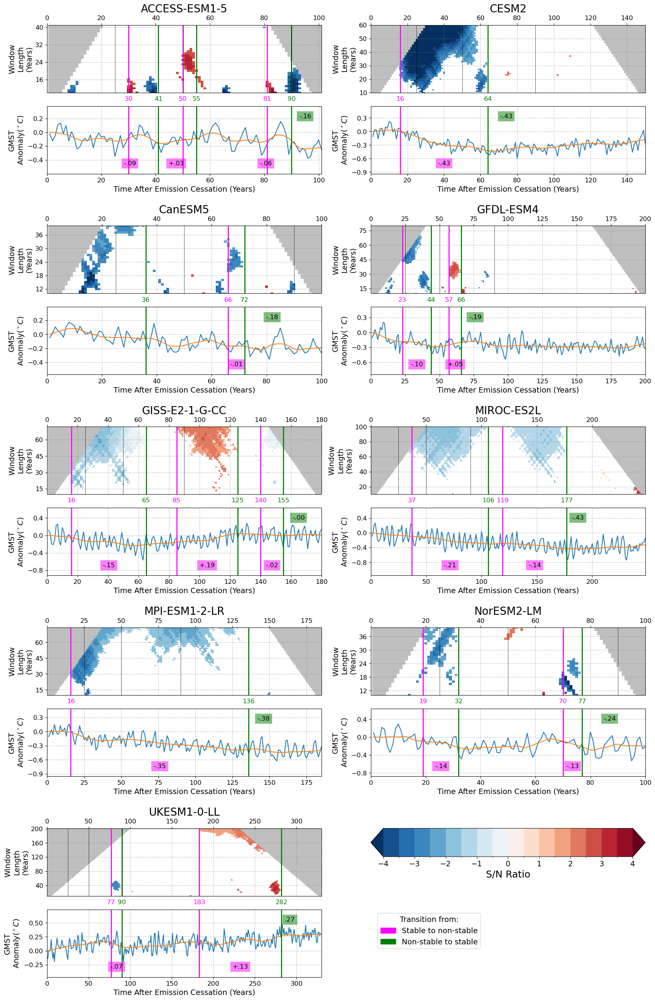

In [334]:

sn_ratio_levels = np.arange(-4, 4.5, .5)
fig = plt.figure(figsize=(20, 32))
outer_gs = gridspec.GridSpec(5, 2, hspace=0.35, wspace=0.18)

# Lists to store axes
upper_axes = []
lower_axes = []

# Loop through the grid positions
for i in range(5):
    for j in range(2):  # Loop over the two columns
        # Create a GridSpec for the inner plots (1 large and 1 small)

        if (i+1)*(j+1) <9: # Don't want the tench plot
            inner_gs = gridspec.GridSpecFromSubplotSpec(
                2, 1, subplot_spec=outer_gs[i, j], hspace=0.2,
                height_ratios=[1, 1])
            
            # Large plot (upper plot)
            upper_ax = fig.add_subplot(inner_gs[0])
            upper_axes.append(upper_ax)
            
            # Small plot (lower plot)
            lower_ax = fig.add_subplot(inner_gs[1])
            lower_axes.append(lower_ax)

models = np.sort(unstable_rolling_ds.model.values)

for model_num, model in enumerate(models):
    ax = upper_axes[model_num]
    ax_lower = lower_axes[model_num]

    cplot = unstable_rolling_ds.sel(model=model).sn.plot(
        y='window', ax=ax, cmap='RdBu_r', levels=sn_ratio_levels, 
        add_colorbar=False, extend='both')
    sn_plotting.grey_mask(ax,sn_rolling_nan_locs.sel(model=model))

    
    a1_model_ds = a1_smean_anom_ds.sel(model=model)
    ax_lower.plot(a1_model_ds.time.values, a1_model_ds.values)
    ax_lower.plot(a1_model_ds.time.values, a1_smean_anom_trendfit_ds.sel(model=model).values)
    # ax_lower.plot(a1_model_ds.time.values, a1_model_ds.rolling(time=20).mean().values,
    #          color='green')

    year_vals = year_stable_and_unstable_rolling_ds.sel(model=model).values
    year_vals = year_vals[np.isfinite(year_vals)].astype(int)
    # year_vals = year_vals[year_vals>0]

    
    for num in range(len(year_vals)):
        if num == len(year_vals)-1:
            # str_xloc = year_vals[num]+10
            str_xloc = year_vals[num] + 10
            #(model_window_information[model]['time_length'] + year_vals[num])/2
            yloc = 0.85
        elif not num%2:
            str_xloc = (year_vals[num]+year_vals[num+1])/2
            yloc = 0.85
        else:
            # str_xloc = year_vals[num+1]
            str_xloc = (year_vals[num]+year_vals[num+1])/2
            yloc = 0.15

        if not num%2: # Stable period
            temp = year_of_stabilisation_df.loc[model, f'stable_period_temp_av_{num}']
            # temp_str = f'T_av=\n{temp:.2f}'
            color = 'green'
        else:
            temp = year_of_stabilisation_df.loc[model, f'unstable_period_temp_change_{num}']
            # temp_str = f'delta T=\n{temp:.2f}'
            color = 'magenta'
        # temp_str = f'{temp:.2f}'
        sign = '+' if temp >= 0 else '-'  # Determine the sign
        if not num%2 and sign == '+':
            sign = ''

        # if 
        # ACCESS doesn't become non-stable
        if 'ACCESS' in model:
            str_xloc = str_xloc-5
        #     temp = 0# np.nanmean(a1_smean_anom_ds.sel(model='ACCESS-ESM1-5').dropna('time').values).item()
            
        temp_str = f'{sign}.'+  f"{abs(temp):.2f}".split('.')[-1] 


        if color != 'green' or (num == len(year_vals)-1):
            # if model_num != 0:
            ax_lower.annotate(temp_str, xy=(str_xloc, yloc), xycoords=('data', 'axes fraction'),
                   fontsize=12, ha='center', va='center', 
                          bbox=dict(facecolor=color, edgecolor='none', alpha=0.5)
                          # color=color
                          )
            
    for num, year in enumerate(year_vals):

        # year_str = str(year)
        if 'UKESM' in model:
            if year == 270:
                year_loc = year-3
            elif year == 281:
                year_loc = year+3 
            else:
                year_loc = year
        elif 'GFDL' in model:
            if year == 59:
                year_loc = year-1
            elif year == 64:
                year_loc = year+1 
            else:
                year_loc = year
        else:
            year_loc = year

        if year != 0:
            ax.axvline(year, c=colors[num%2], linewidth=2)
            ax.annotate(year, xy=(year_loc, -0.05),
                xycoords=('data', 'axes fraction'),
                color=colors[num%2], fontsize=12, clip_on=False,
                ha='center', va='top')
  
            ax_lower.axvline(year, c=colors[num%2], linewidth=2)



    ax.set_xlim(0,model_window_information[model]['time_length'])
    ax_lower.set_xlim(0,model_window_information[model]['time_length'])
    ylim = model_window_information[model]['max_window']# if 'UKESM' not in model else 200
    ax.set_ylim(10, ylim)
    ax.set_title(model, fontsize=20)

    ax.grid(True, linestyle='--', alpha=0.5, color='grey')
    ax_lower.grid(True, linestyle='--', alpha=0.5, color='grey')

    # Lines showing the ZEC 25, 50, and 90 period
    zec_line_kwargs =  dict(linewidth=0.5, linestyle='-', alpha=1)
    ax.axvline(25, color='k', **zec_line_kwargs)
    ax.axvline(50, color='k', **zec_line_kwargs)
    ax.axvline(90, color='k',  **zec_line_kwargs)
    # ax_lower.axvline(25, color='k', **zec_line_kwargs)
    # ax_lower.axvline(50, color='k', **zec_line_kwargs)
    # ax_lower.axvline(90, color='k', **zec_line_kwargs)
    
    ax.xaxis.set_label_position('top')
    ax.xaxis.tick_top()
    ax.set_xlabel('')
    ax_lower.set_xlabel('Time After Emission Cessation (Years)', fontsize=14)
    ax.set_ylabel('Window\nLength\n(Years)', fontsize=14)
    ax_lower.set_ylabel('GMST\nAnomaly'+r'($^\circ C$)', fontsize=14)
    ax_lower.tick_params(axis='both', which='major', labelsize=12)
    ax.tick_params(axis='both', which='major', labelsize=12) 
    ylim_frac = np.diff(np.array(ax_lower.get_ylim()))[0]/3
    ax_lower.set_ylim(ax_lower.get_ylim()[0]-ylim_frac, ax_lower.get_ylim()[-1]+ylim_frac)
    ax_lower.yaxis.set_major_locator(MaxNLocator(nbins=5))
    ax.yaxis.set_major_locator(MaxNLocator(nbins=5))


# Add colorbar to the lower right-hand side

inner_gs_cax = gridspec.GridSpecFromSubplotSpec(
    2, 1, subplot_spec=outer_gs[-1, -1], hspace=0.1,
    height_ratios=[0.2, 0.8])
cax = fig.add_subplot(inner_gs_cax[0])   
cbar = plt.colorbar(cplot, cax=cax, orientation='horizontal', extend='both')
cbar.set_label('S/N Ratio', fontsize=18)
cbar.ax.tick_params(labelsize=14) 

magenta_patch = mpatches.Patch(color='magenta', label='Stable to non-stable')
green_patch = mpatches.Patch(color='green', label='Non-stable to stable' )
leg = fig.legend(handles=[magenta_patch, green_patch], loc='lower center',
                 ncol=1, fontsize=14, bbox_to_anchor=[0.62, 0.13])
leg.set_title('Transition from:', prop={'size': 14})

## Figure S1 (ZEC Time Series)

In [260]:
models = a1_smean_anom_ds.model.values

Text(0.5, 0, 'Time (Years)')

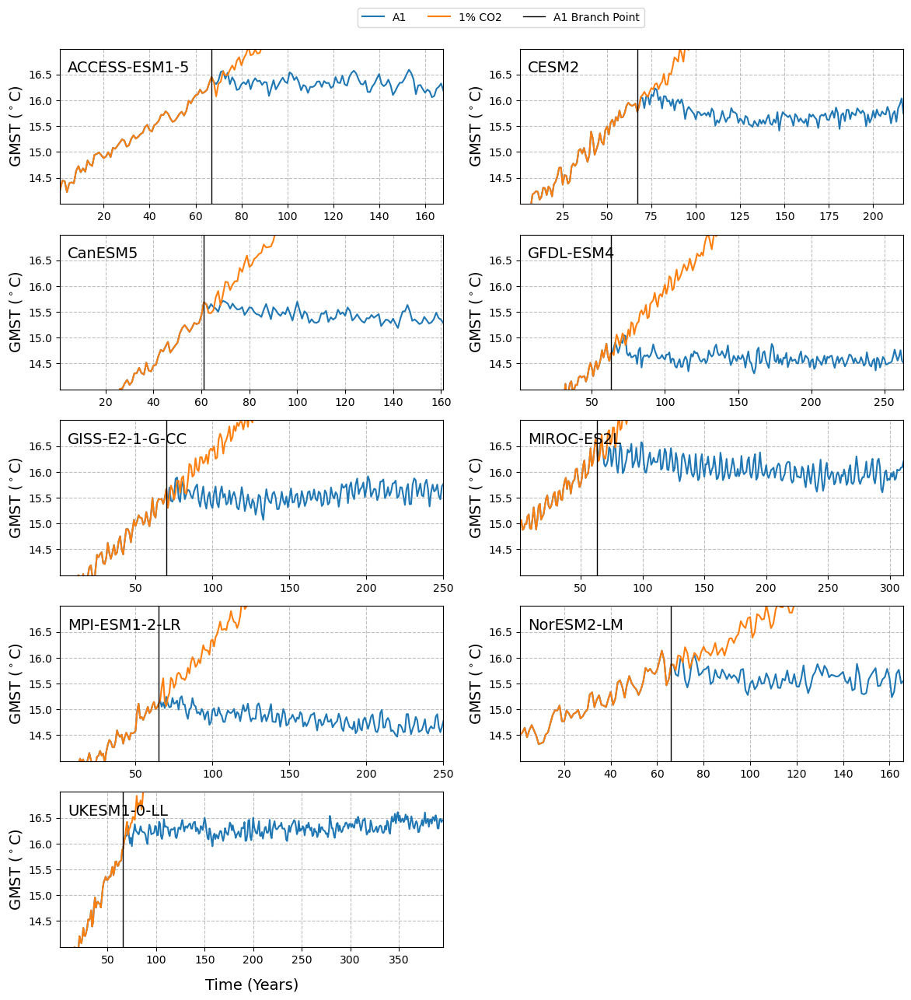

In [331]:
ncols = 2
nrows = int(np.ceil(len(models)/ncols))

fig = plt.figure(figsize=(7*ncols, 3*nrows))
gs = gridspec.GridSpec(nrows, ncols, hspace=0.2, wspace=.2)
axes = [fig.add_subplot(gs[i]) for i in range(9)]

for num, (model, ds_orig) in enumerate(pct_smean_xrlist):
    ax = axes[num]
    ds = ds_orig.copy(deep=True)  # Create a deep copy to avoid modifying the original dataset
    ds2 = a1_smean_xrlist[model].copy(deep=True)
    ds  = ds.sel(time=slice(None, ds2.time.values[0]))
    ds2 = ds2.combine_first(ds.isel(time=slice(-2, -1)))
    ds = ds.combine_first(ds2)
    start_arg = np.argwhere(ds.time.values == ds2.time.values[0]).item()
    
    # Ensure that reset_time_to_0_start returns a new dataset
    ds = utils.reset_time_to_0_start(ds.copy(deep=True))
    ds_orig = utils.reset_time_to_0_start(ds_orig.copy(deep=True))  # Create a deep copy to avoid modifying the original dataset
    
    ds['time'] = ds.time.dt.year.values
    ds_orig['time'] = ds_orig.time.dt.year.values
    

    # A1
    ax.plot(ds.time.values, ds.squeeze().values, label='A1')
    # 1% CO2
    ax.plot(ds_orig.time.values, ds_orig.squeeze().values, label='1% CO2')

    # Vertical Line marking start of A1
    ax.axvline(ds.time.values[start_arg], linewidth=1, color='black', label='A1 Branch Point')


    ax.annotate(model, xy=(0.02, 0.85), fontsize=14, xycoords='axes fraction')
    ax.set_ylim([14, 17])
    ax.set_yticks(np.arange(14.5, 17, 0.5))
    ax.set_xlim(np.take(ds.time.values, [0, -1]))
    ax.set_ylabel('GMST ' + r'($^\circ$C)', fontsize=14)


    ax.grid(True, alpha=0.5, c='grey', linestyle='--')

leg = axes[1].legend(ncol=7, bbox_to_anchor=[-0.05, 1.3], loc='upper center', fontsize=10)
axes[-1].set_xlabel('Time (Years)', va='bottom', fontsize=14, labelpad=25)

## Figure S2 - piContorl S/N ratios and Drift

- locator: <matplotlib.ticker.FixedLocator object at 0x1503abd91000>


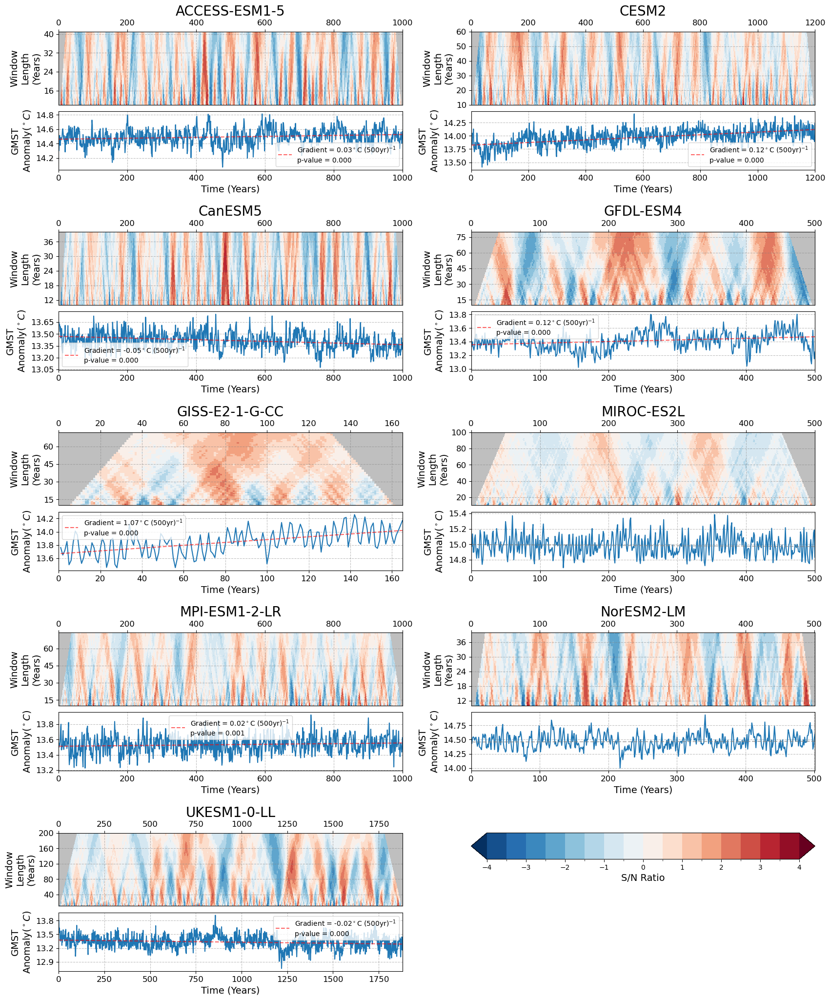

In [252]:

sn_ratio_levels = np.arange(-4, 4.5, .5)
fig = plt.figure(figsize=(20, 25))
outer_gs = gridspec.GridSpec(5, 2, hspace=0.45, wspace=0.2)

# Lists to store axes
upper_axes = []
lower_axes = []

# Loop through the grid positions
for i in range(5):
    for j in range(2):  # Loop over the two columns
        # Create a GridSpec for the inner plots (1 large and 1 small)

        if (i+1)*(j+1) <9: # Don't want the tench plot
            inner_gs = gridspec.GridSpecFromSubplotSpec(
                2, 1, subplot_spec=outer_gs[i, j], hspace=0.1,
                height_ratios=[1, 0.8])
            
            # Large plot (upper plot)
            upper_ax = fig.add_subplot(inner_gs[0])
            upper_axes.append(upper_ax)
            
            # Small plot (lower plot)
            lower_ax = fig.add_subplot(inner_gs[1])
            lower_axes.append(lower_ax)

for num, model in enumerate(models):
    ax = upper_axes[num]
    ax_lower = lower_axes[num]

    sn_multi_rolling_control_model_da = sn_multi_rolling_control_ds.sel(model=model)
    sn_multi_rolling_control_model_da['time'] = sn_multi_rolling_control_model_da.time.dt.year.values

    model_max_window = model_window_information[model]['max_window'] if 'UKESM' not in model else 200
    cplot = sn_multi_rolling_control_model_da.sel(
        window=slice(10, model_max_window)).plot(
        y='window', ax=ax, cmap='RdBu_r', levels=sn_ratio_levels, 
        add_colorbar=False, extend='both')
    sn_plotting.grey_mask(ax,np.isnan(sn_multi_rolling_control_model_da))

    
    esmpi_smean_model_ds = esmpi_smean_ds.sel(model=model)
    esmpi_smean_model_ds['time'] = esmpi_smean_model_ds.time.dt.year.values
    time_legth = len(esmpi_smean_model_ds.dropna(dim='time').time.values)
    time1 = esmpi_smean_model_ds.time.values
    ax_lower.plot(time1, esmpi_smean_model_ds.values)


    init_y = esmpi_smean_model_ds.squeeze().dropna(dim='time').values
    time = esmpi_smean_model_ds.squeeze().dropna(dim='time').time.values

    x = np.arange(len(init_y))
    grad_yint = np.polyfit(x, init_y, deg=1)

    fitted_line = np.polyval(grad_yint, x)
    mk_val = pymannkendall.original_test(init_y)
    mk_pval = mk_val.p
    if mk_pval < 0.05:
        color = 'red'
        label = f'Gradient = {grad_yint[0]*500:.2f}' + r'$^\circ$C (500yr)$^{-1}$' + f'\np-value = {mk_pval:.3f}'
    else:
        color='grey'
        label=None

    ax_lower.plot(time, fitted_line, linestyle='--', alpha=0.6, color=color, label=label)
    if mk_pval < 0.05: ax_lower.legend(ncol=1, loc='best')#bbox_to_anchor=(0.6, 1.06))
    # ax_lower.plot(esmpi_smean_model_ds.time.values, esmpi_smean_model_ds.rolling(time=20).mean().values,
    #          color='green')
        
    # for num,year in enumerate(year_stable_and_unstable_rolling_ds.sel(model=model).values):
    #     ax.axvline(year, c=colors[num%2], linewidth=2)
    #     ax_lower.axvline(year, c=colors[num%2], linewidth=2)


    # ax.set_xlim(0,model_window_information[model]['time_length'])
    # ax_lower.set_xlim(0,model_window_information[model]['time_length'])
    ax.set_ylim(10, model_max_window)
    ax.set_title(model, fontsize=20)
    ax.set_xlim(0, time_legth)
    ax_lower.set_xlim(0, time_legth)


    ax.grid(True, linestyle='--', alpha=0.5, color='grey')
    ax_lower.grid(True, linestyle='--', alpha=0.5, color='grey')

    ax.xaxis.set_label_position('top')
    ax.xaxis.tick_top()
    ax.set_xlabel('')
    ax_lower.set_xlabel('Time (Years)', fontsize=14)
    ax.set_ylabel('Window\nLength\n(Years)', fontsize=14)
    ax_lower.set_ylabel('GMST\nAnomaly'+r'($^\circ C$)', fontsize=14)
    ax_lower.tick_params(axis='both', which='major', labelsize=12)
    ax.tick_params(axis='both', which='major', labelsize=12) 
    ax_lower.yaxis.set_major_locator(MaxNLocator(nbins=5))
    ax.yaxis.set_major_locator(MaxNLocator(nbins=5))


# Add colorbar to the lower right-hand side

inner_gs_cax = gridspec.GridSpecFromSubplotSpec(
    2, 1, subplot_spec=outer_gs[-1, -1], hspace=0.1,
    height_ratios=[0.2, 0.8])
cax = fig.add_subplot(inner_gs_cax[0])   
cbar = plt.colorbar(cplot, cax=cax, orientation='horizontal', extend='both')
cbar.set_label('S/N Ratio', fontsize=14)


## Fig S3 ( Method Demonstration)

In [265]:
# Manual Calculation for Demonstations
WINDOW=25
# Sample period is the years that we want to look at
sample_period = (30,70+30) #(1200,1261), 61

# The length of the sample_period varible
window_length = WINDOW
imodel = 2

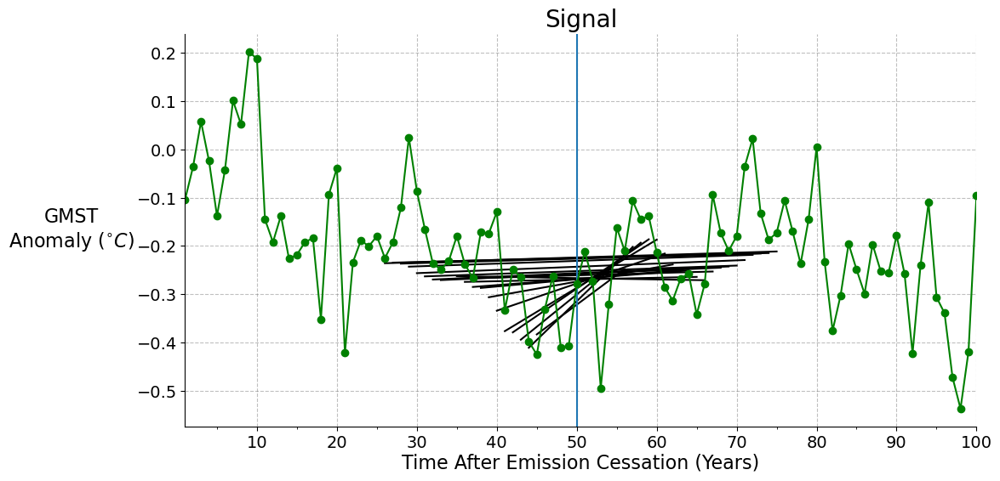

In [269]:
fig = plt.figure(figsize=(12,6))
ax = fig.add_subplot(111)

imodel = -6
sample_period = (0,100) #(1200,1261), 61


time_slice = slice(*sample_period)
sample_data = a1_smean_anom_ds.isel(model=imodel).isel(time=slice(*sample_period)).squeeze()


central_point = 50
for window_length in range(10,50):
    # Skip even window lengths
    if not window_length % 2: continue
    half_central = int(np.ceil(window_length/2))
    arr = sample_data.values[central_point-half_central:central_point+half_central]#.isel(time=time_slice)
    x = np.arange(len(arr))
    coeffs= np.polyfit(x, arr, deg=1)
    yhat = np.polyval(coeffs, x)
    ax.plot(sample_data.time.values[central_point-half_central:central_point+half_central], yhat, color='black')

ax.axvline(central_point)

ax.plot(sample_data.time.values, sample_data.values, marker='o', label='Simulation',
             color='green')


ax.set_xlim(sample_data.time.values[0], sample_data.time.values[-1])
# ax.legend(ncol=2, fontsize=plotting_functions.PlotConfig.legend_text_size)

plotting_functions.format_axis(ax, title='Signal', xlabel='Time After Emission Cessation (Years)', 
                               ylabel='GMST\n'+r'Anomaly ($^{\circ}C$)',
                               labelpad=55, invisible_spines=['top', 'right'])
sn_plotting.format_ticks_as_years(ax, sample_data.time.values, logginglevel='ERROR')

GFDL-ESM4


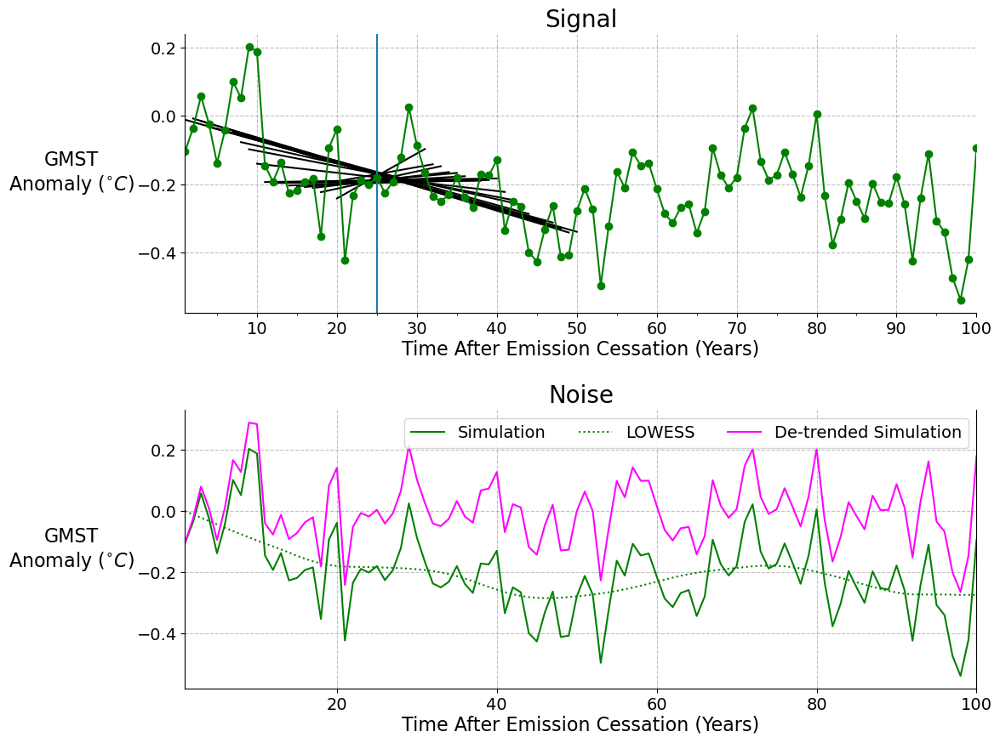

In [297]:
fig = plt.figure(figsize=(12,10))
gs = gridspec.GridSpec(2, 1, hspace=0.35)
ax = fig.add_subplot(gs[0])
ax1 = fig.add_subplot(gs[1])


imodel = -6
sample_period = (0,100) #(1200,1261), 61


time_slice = slice(*sample_period)
sample_data = a1_smean_anom_ds.isel(model=imodel).isel(time=slice(*sample_period)).squeeze()
print(sample_data.model.values)

central_point = 25
for window_length in range(10,50):
    # Skip even window lengths
    if not window_length % 2: continue
    half_central = int(np.ceil(window_length/2))
    arr = sample_data.values[central_point-half_central:central_point+half_central]#.isel(time=time_slice)
    x = np.arange(len(arr))
    coeffs= np.polyfit(x, arr, deg=1)
    yhat = np.polyval(coeffs, x)
    ax.plot(sample_data.time.values[central_point-half_central:central_point+half_central], yhat, color='black')

ax.axvline(central_point, label='Central Point')

ax.plot(sample_data.time.values, sample_data.values, marker='o', label='Simulation',
             color='green')


ax.set_xlim(sample_data.time.values[0], sample_data.time.values[-1])
# ax.legend(ncol=2, fontsize=plotting_functions.PlotConfig.legend_text_size)

plotting_functions.format_axis(ax, title='Signal', xlabel='Time After Emission Cessation (Years)', 
                               ylabel='GMST\n'+r'Anomaly ($^{\circ}C$)',
                               labelpad=55, invisible_spines=['top', 'right'])
sn_plotting.format_ticks_as_years(ax, sample_data.time.values, logginglevel='ERROR')



time = a1_smean_anom_ds.dropna(dim='time').time.values
lns1 = ax1.plot(time, a1_smean_anom_ds.dropna(dim='time').isel(model=imodel).values, color='green', label='Simulation')
lns2 = ax1.plot(time, a1_smean_anom_trendfit_ds.dropna(dim='time').isel(model=imodel).values, label='LOWESS',
                color='green', linestyle=':')
lns3 = ax1.plot(time, a1_smean_anom_detrend_ds.dropna(dim='time').isel(model=imodel).values-\
                a1_smean_trendfit_ds.dropna(dim='time').isel(model=imodel).values[0], label='De-trended Simulation',
                color='magenta')
sn_plotting.format_ticks_as_years(axes[1], time, logginglevel='ERROR')
ax1.set_xlim(np.take(time, [0, -1]))

plotting_functions.format_axis(ax1, title='Noise', xlabel='Time After Emission Cessation (Years)', ylabel='GMST\n'+r'Anomaly ($^{\circ}C$)',
                               labelpad=55, invisible_spines=['top'])

ax1.legend(ncol=3, loc='best', fontsize=plotting_functions.PlotConfig.legend_text_size)# let

## Figure S5 - All S/N Ratios for A1

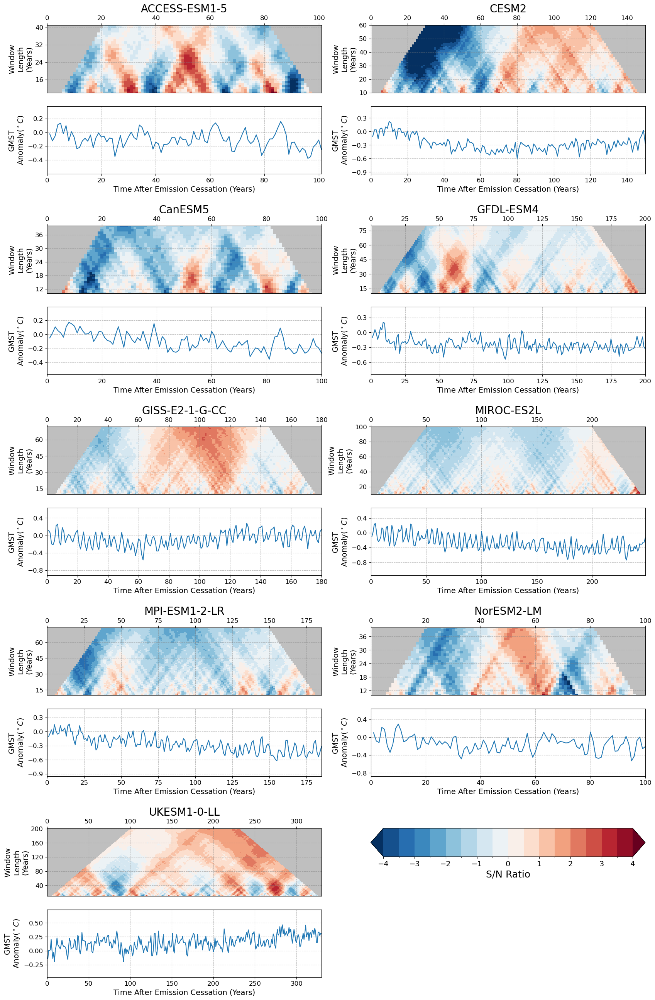

In [335]:

sn_ratio_levels = np.arange(-4, 4.5, .5)
fig = plt.figure(figsize=(20, 32))
outer_gs = gridspec.GridSpec(5, 2, hspace=0.35, wspace=0.18)

# Lists to store axes
upper_axes = []
lower_axes = []

# Loop through the grid positions
for i in range(5):
    for j in range(2):  # Loop over the two columns
        # Create a GridSpec for the inner plots (1 large and 1 small)

        if (i+1)*(j+1) <9: # Don't want the tench plot
            inner_gs = gridspec.GridSpecFromSubplotSpec(
                2, 1, subplot_spec=outer_gs[i, j], hspace=0.2,
                height_ratios=[1, 1])
            
            # Large plot (upper plot)
            upper_ax = fig.add_subplot(inner_gs[0])
            upper_axes.append(upper_ax)
            
            # Small plot (lower plot)
            lower_ax = fig.add_subplot(inner_gs[1])
            lower_axes.append(lower_ax)

for num, model in enumerate(models):
    ax = upper_axes[num]
    ax_lower = lower_axes[num]

    cplot = sn_multi_rolling_da.sel(model=model).plot(
        y='window', ax=ax, cmap='RdBu_r', levels=sn_ratio_levels, 
        add_colorbar=False, extend='both')
    sn_plotting.grey_mask(ax,sn_rolling_nan_locs.sel(model=model))

    
    a1_model_ds = a1_smean_anom_ds.sel(model=model)
    ax_lower.plot(a1_model_ds.time.values, a1_model_ds.values)
    # ax_lower.plot(a1_model_ds.time.values, a1_model_ds.rolling(time=20).mean().values,
    #          color='green')

    year_vals = year_stable_and_unstable_rolling_ds.sel(model=model).values
    year_vals = year_vals[np.isfinite(year_vals)].astype(int)
    # year_vals = year_vals[year_vals>0]




    ax.set_xlim(0,model_window_information[model]['time_length'])
    ax_lower.set_xlim(0,model_window_information[model]['time_length'])
    ylim = model_window_information[model]['max_window']# if 'UKESM' not in model else 200
    ax.set_ylim(10, ylim)
    ax.set_title(model, fontsize=20)

    ax.grid(True, linestyle='--', alpha=0.5, color='grey')
    ax_lower.grid(True, linestyle='--', alpha=0.5, color='grey')

    ax.xaxis.set_label_position('top')
    ax.xaxis.tick_top()
    ax.set_xlabel('')
    ax_lower.set_xlabel('Time After Emission Cessation (Years)', fontsize=14)
    ax.set_ylabel('Window\nLength\n(Years)', fontsize=14)
    ax_lower.set_ylabel('GMST\nAnomaly'+r'($^\circ C$)', fontsize=14)
    ax_lower.tick_params(axis='both', which='major', labelsize=12)
    ax.tick_params(axis='both', which='major', labelsize=12) 
    ylim_frac = np.diff(np.array(ax_lower.get_ylim()))[0]/3
    ax_lower.set_ylim(ax_lower.get_ylim()[0]-ylim_frac, ax_lower.get_ylim()[-1]+ylim_frac)
    ax_lower.yaxis.set_major_locator(MaxNLocator(nbins=5))
    ax.yaxis.set_major_locator(MaxNLocator(nbins=5))


# Add colorbar to the lower right-hand side

inner_gs_cax = gridspec.GridSpecFromSubplotSpec(
    2, 1, subplot_spec=outer_gs[-1, -1], hspace=0.1,
    height_ratios=[0.2, 0.8])
cax = fig.add_subplot(inner_gs_cax[0])   
cbar = plt.colorbar(cplot, cax=cax, orientation='horizontal', extend='both')
cbar.set_label('S/N Ratio', fontsize=18)
cbar.ax.tick_params(labelsize=14) 
# cbar.set_label('Signal '+r'($^\circ$C)', fontsize=14)

- locator: <matplotlib.ticker.FixedLocator object at 0x150451945930>


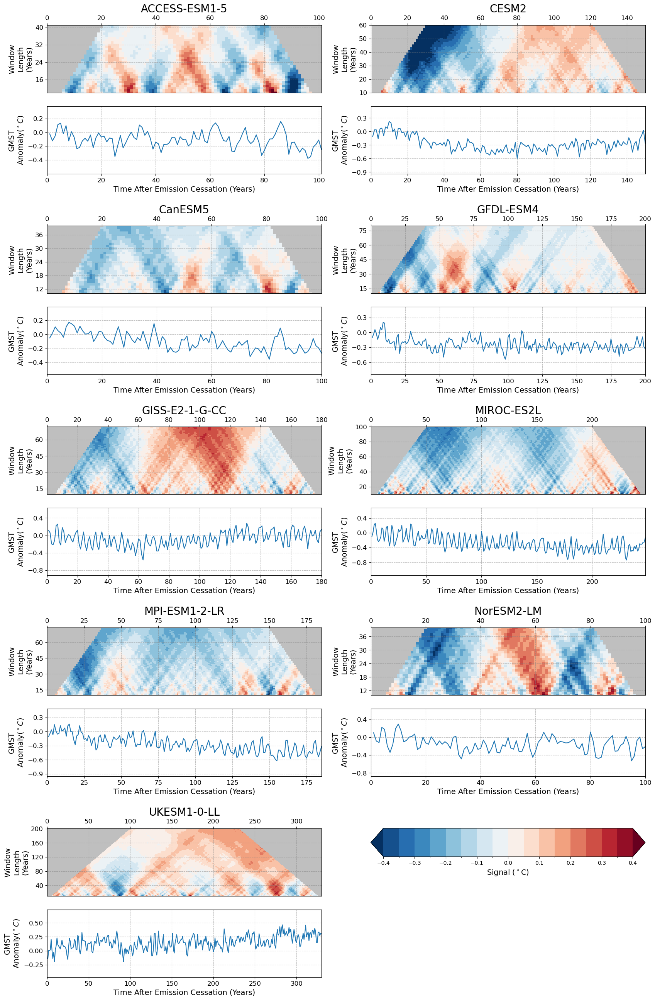

In [258]:

sn_ratio_levels = np.arange(-4, 4.5, .5)/10
fig = plt.figure(figsize=(20, 32))
outer_gs = gridspec.GridSpec(5, 2, hspace=0.35, wspace=0.18)

# Lists to store axes
upper_axes = []
lower_axes = []

# Loop through the grid positions
for i in range(5):
    for j in range(2):  # Loop over the two columns
        # Create a GridSpec for the inner plots (1 large and 1 small)

        if (i+1)*(j+1) <9: # Don't want the tench plot
            inner_gs = gridspec.GridSpecFromSubplotSpec(
                2, 1, subplot_spec=outer_gs[i, j], hspace=0.2,
                height_ratios=[1, 1])
            
            # Large plot (upper plot)
            upper_ax = fig.add_subplot(inner_gs[0])
            upper_axes.append(upper_ax)
            
            # Small plot (lower plot)
            lower_ax = fig.add_subplot(inner_gs[1])
            lower_axes.append(lower_ax)

for num, model in enumerate(models):
    ax = upper_axes[num]
    ax_lower = lower_axes[num]

    cplot = signal_multi_rolling_da.sel(model=model).plot(
        y='window', ax=ax, cmap='RdBu_r', levels=sn_ratio_levels, 
        add_colorbar=False, extend='both')
    sn_plotting.grey_mask(ax,sn_rolling_nan_locs.sel(model=model))

    
    a1_model_ds = a1_smean_anom_ds.sel(model=model)
    ax_lower.plot(a1_model_ds.time.values, a1_model_ds.values)
    # ax_lower.plot(a1_model_ds.time.values, a1_model_ds.rolling(time=20).mean().values,
    #          color='green')

    year_vals = year_stable_and_unstable_rolling_ds.sel(model=model).values
    year_vals = year_vals[np.isfinite(year_vals)].astype(int)
    # year_vals = year_vals[year_vals>0]




    ax.set_xlim(0,model_window_information[model]['time_length'])
    ax_lower.set_xlim(0,model_window_information[model]['time_length'])
    ylim = model_window_information[model]['max_window']# if 'UKESM' not in model else 200
    ax.set_ylim(10, ylim)
    ax.set_title(model, fontsize=20)

    ax.grid(True, linestyle='--', alpha=0.5, color='grey')
    ax_lower.grid(True, linestyle='--', alpha=0.5, color='grey')

    ax.xaxis.set_label_position('top')
    ax.xaxis.tick_top()
    ax.set_xlabel('')
    ax_lower.set_xlabel('Time After Emission Cessation (Years)', fontsize=14)
    ax.set_ylabel('Window\nLength\n(Years)', fontsize=14)
    ax_lower.set_ylabel('GMST\nAnomaly'+r'($^\circ C$)', fontsize=14)
    ax_lower.tick_params(axis='both', which='major', labelsize=12)
    ax.tick_params(axis='both', which='major', labelsize=12) 
    ylim_frac = np.diff(np.array(ax_lower.get_ylim()))[0]/3
    ax_lower.set_ylim(ax_lower.get_ylim()[0]-ylim_frac, ax_lower.get_ylim()[-1]+ylim_frac)
    ax_lower.yaxis.set_major_locator(MaxNLocator(nbins=5))
    ax.yaxis.set_major_locator(MaxNLocator(nbins=5))


# Add colorbar to the lower right-hand side

inner_gs_cax = gridspec.GridSpecFromSubplotSpec(
    2, 1, subplot_spec=outer_gs[-1, -1], hspace=0.1,
    height_ratios=[0.2, 0.8])
cax = fig.add_subplot(inner_gs_cax[0])   
cbar = plt.colorbar(cplot, cax=cax, orientation='horizontal', extend='both')
cbar.set_label('Signal '+r'($^\circ$C)', fontsize=14)

### Figure S2 (Global Drift)

In [263]:
import pymannkendall

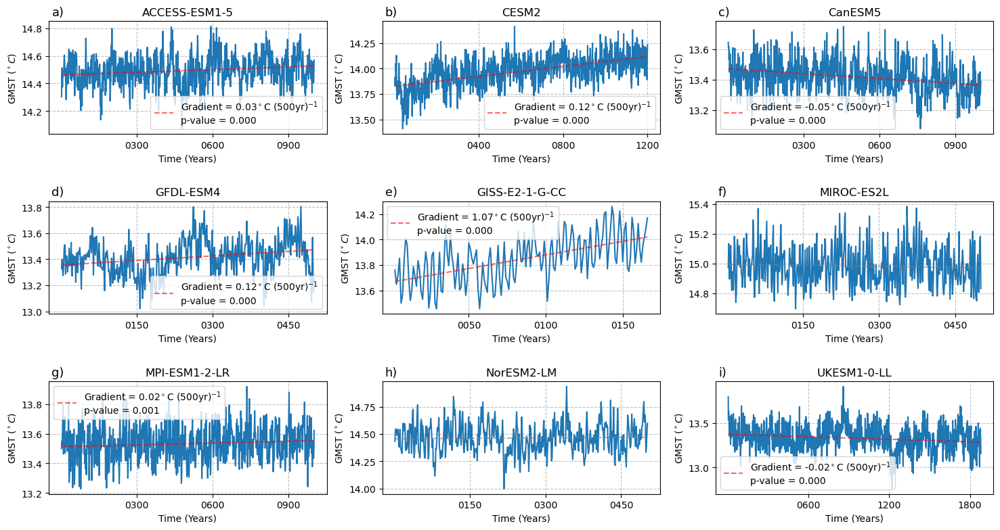

In [264]:
models = esmpi_smean_xrlist.refkeys
ncols = 3; nrows = int(np.ceil(len(models)/2))

fig = plt.figure(figsize=(18, 16))
gs = gridspec.GridSpec(nrows=nrows, ncols=ncols, hspace=0.6)

for num, (model, ds) in enumerate(esmpi_smean_xrlist):
    ax = fig.add_subplot(gs[num])
    time = utils.convert_to_0_start_cftime(ds.time.values)
    ax.plot(time,ds.squeeze())
    
    plotting_functions.add_figure_label(ax, f'{chr(97+num)})', font_scale=0.8)
    ax.set_title(model); ax.set_ylabel(r'GMST $(^\circ C)$'); ax.set_xlabel('Time (Years)')
    # ax.set_xlim([time[0], time[-1]])
    
    init_y = ds.squeeze().values
    x = np.arange(len(init_y))
    grad_yint = np.polyfit(x, init_y, deg=1)

    fitted_line = np.polyval(grad_yint, x)
    mk_val = pymannkendall.original_test(init_y)
    mk_pval = mk_val.p
    if mk_pval < 0.05:
        color = 'red'
        label = f'Gradient = {grad_yint[0]*500:.2f}' + r'$^\circ$C (500yr)$^{-1}$' + f'\np-value = {mk_pval:.3f}'
    else:
        color='grey'
        label=None
    
    ax.plot(time, fitted_line, linestyle='--', alpha=0.6, color=color, label=label)
    ax.grid(True, alpha=0.5, c='grey', linestyle='--')
    if mk_pval < 0.05: ax.legend(ncol=1, loc='best')#bbox_to_anchor=(0.6, 1.06))

### Fig S6 - Segments from Pi-Control

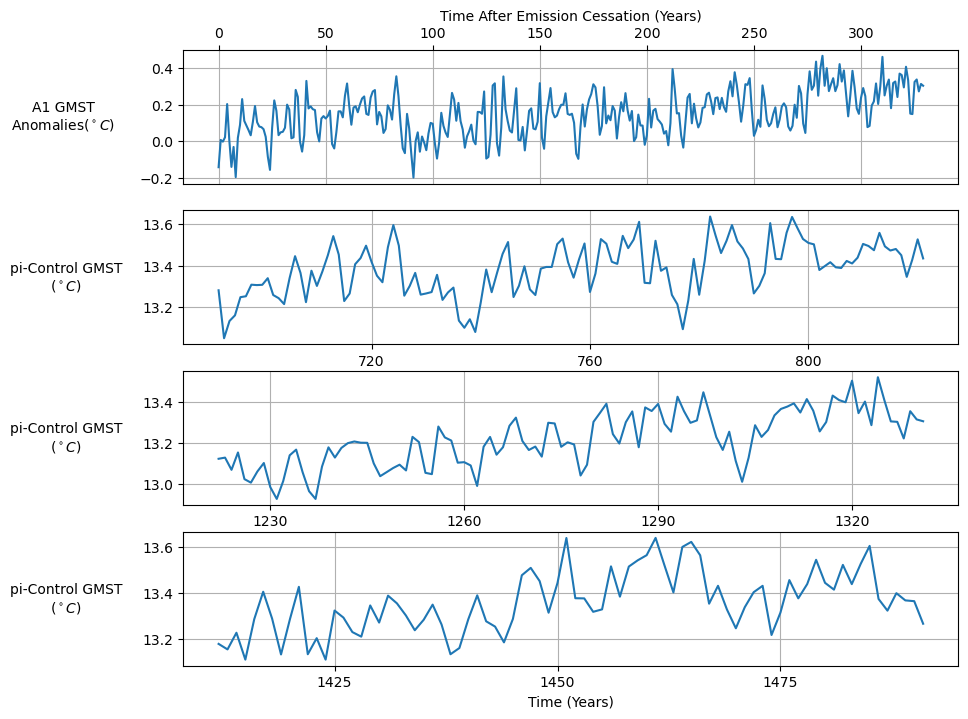

In [312]:
fig,(ax1, ax2, ax3, ax4) = plt.subplots(4, 1,figsize=(10, 8))
# ax2 = ax.twinx()
ax1.plot(a1_smean_anom_ds.sel(model='UKESM1-0-LL').values)
# ax2.plot(esmpi_smean_ds.sel(model='UKESM1-0-LL').isel(time=slice(650, 780)).values)
esmpi_smean_ds.sel(model='UKESM1-0-LL').isel(time=slice(650, 780)).plot(ax=ax2)
esmpi_smean_ds.isel(time=slice(1220, 1330)).sel(model='UKESM1-0-LL').plot(ax=ax3)
esmpi_smean_ds.sel(model='UKESM1-0-LL').isel(time=slice(1410, 1490)).plot(ax=ax4)

ax1.set_ylabel('A1 GMST\nAnomalies' + r'($^\circ C$)', rotation=0, labelpad=55, va='center', ha='center')
ax2.set_ylabel('pi-Control GMST\n' + r'($^\circ C$)', rotation=0, labelpad=55, va='center', ha='center')
ax3.set_ylabel('pi-Control GMST\n' + r'($^\circ C$)', rotation=0, labelpad=55, va='center', ha='center')
ax4.set_ylabel('pi-Control GMST\n' + r'($^\circ C$)', rotation=0, labelpad=55, va='center', ha='center')

ax2.set_xticklabels([int(t.get_text()) for t in ax2.get_xticklabels()[1:]])
# sn_plotting.format_ticks_as_years(ax2, esmpi_smean_ds.sel(model='UKESM1-0-LL').isel(time=slice(650, 780)).time)

ax1.xaxis.set_label_position('top')
ax1.xaxis.tick_top()
ax1.set_xlabel('Time After Emission Cessation (Years)')
ax4.set_xlabel('Time (Years)')

for ax in [ax1, ax2, ax3, ax4]:
    ax.set_title('')
    ax.grid(True)

## Un-used supplementary (Stable and unstable demonstration)

Text(0.5, 1.0, '')

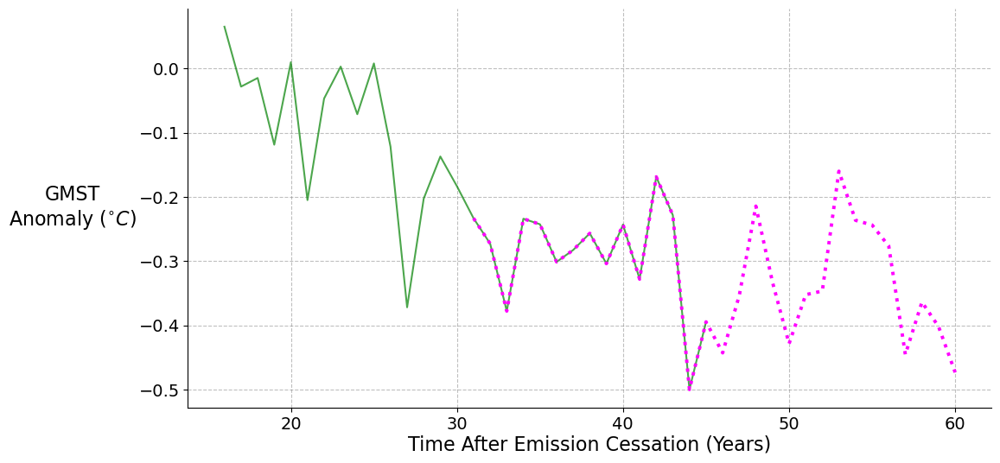

In [277]:
plt.style.use('default')
fig = plt.figure(figsize=(12,6))
ax1 = fig.add_subplot(111)

a1_smean_anom_ds.sel(model='CESM2').isel(time=slice(15, 45)).plot(color='green', alpha=0.7)
a1_smean_anom_ds.sel(model='CESM2').isel(time=slice(30, 60)).plot(
    color='magenta',linestyle=':', linewidth=2.8)

plotting_functions.format_axis(
    ax1, xlabel='Time After Emission Cessation (Years)', title='',
    ylabel='GMST\n'+r'Anomaly ($^{\circ}C$)',
    labelpad=55, invisible_spines=['top', 'right'])
ax1.set_title('')

# sn_plotting.format_ticks_as_years(ax1, a1_smean_anom_ds.isel(time=slice(15, 60)).time.dt.year.values,
#                                   logginglevel='ERROR')

# ax1.set_xticklabels(a1_smean_anom_ds.isel(time=slice(14, 60)).time.dt.year.values[::15])

In [281]:
stability_colorplot_kwargs = dict(xlims=(0, 90), patch=False, ax2_ylabel='', ylabel='',
                                  cmap='RdBu_r', bbox_to_anchor=(1, 1.4), labelpad_left=65, labelpad_right=15, extend='both',
                                  cut_ticks=2, vmax=4, step=0.5,  font_scale=1.4, cbar_label='Signal-To-Noise Ratio', hspace=0.2,
                                  return_all=True, rotation=90)

In [299]:
# %matplotlib inline
# models = unstable_rolling_ds.model.values
# font_scale = 1.4


# num_plots = len(models)
# num_cols = 2
# num_rows = int(np.ceil(num_plots/num_cols))

# fig = plt.figure(figsize=(sn_plotting.plot_kwargs['width']*1.5,  sn_plotting.plot_kwargs['height']*num_plots/5))
# gs = gridspec.GridSpec(num_rows+2, num_cols, height_ratios=num_rows*[1] + [0.4]+[0.2],hspace=0, wspace=0.2)
# axes = [fig.add_subplot(gs[i]) for i in range(num_plots)]

# for num, model in enumerate(models):
#     add_colorbar=False; cax=None
#     if  num == len(models)-1: add_colorbar=True; cax=fig.add_subplot(gs[num_rows+1, :])
    
#     fig, returned_axes = sn_plotting.sn_multi_window_in_time(
#         sn_multi_rolling_ds.sel(model=model).isel(time=slice(None, 50)).squeeze().sn,
#         temp_da=a1_smean_anom_ds.squeeze().sel(model=model),
#         # stable_point_ds = rolling_year_stable_ds.sel(model=model),#rolling_year_stable_ds.sel(model=model),
#         fig=fig, gs=gs, ax=axes[num], cax=cax, add_colorbar=add_colorbar, yticks = np.arange(5, 45, 5),
#         axes_title='', yticks_right = np.arange(-0.6, 1, .2), **stability_colorplot_kwargs) 
    
#     ax, ax2, cax = returned_axes
    
#     # Lines at zec25 and zec50
#     ax.axvline(25, 0, 1000, color='k', linewidth=2, linestyle='--')
#     ax.axvline(50, 0, 1000, color='k', linewidth=2, linestyle='--')

#     for snum,year in enumerate(year_stable_and_unstable_static_ds.sel(model=model).values):
#         ax.axvline(year, c=line_colors[snum%2], linewidth=2.5)

#     ax.axvspan(50, 90, color='grey', alpha=0.5)

    
#     plotting_functions.clip_axis_ends(ax)
#     plotting_functions.clip_axis_ends(ax2)

#     ax.set_ylabel('')
#     ax2.set_ylabel('')
#     if num  == 4: ax.set_ylabel('Window Length (Years)', size=plotting_functions.PlotConfig.title_size*font_scale)
#     if num  == 5: ax2.set_ylabel(f'GMST Anomaly({units})', size=plotting_functions.PlotConfig.title_size*font_scale)
#     ax.annotate(model, xy=(0.72, 0.85), xycoords='axes fraction', ha='left', size=plotting_functions.PlotConfig.title_size*font_scale)
#     if num <= 1:
#         ax.xaxis.set_label_position('top')
#         ax.xaxis.tick_top()
    
#     if 1 < num < 7:
#         ax.set_xticklabels([])
#         ax.set_xlabel('')

# magenta_patch = mpatches.Patch(color='magenta', label='Non-stable to stable')
# green_patch = mpatches.Patch(color='green', label='Stable to non-stable')
# leg = fig.legend(handles=[magenta_patch, green_patch], loc='lower center', ncol=1, fontsize=25, bbox_to_anchor=[0.7, 0.17])
# leg.set_title('Transition from:', prop={'size': 35})

In [300]:
signal_colorplot_kwargs = {'max_color_lim': 60,
 'xlims': (0, 90),
 'patch': False,
 'ax2_ylabel': '',
 'ylabel': '',
 'cmap': 'RdBu_r',
 'bbox_to_anchor': (1, 1.4),
 'labelpad_left': 65,
 'labelpad_right': 15,
 'extend': 'both',
 'cut_ticks': 2,
 'vmax': .4,
 'step': 0.05,
 'font_scale': 1.4,
 'cbar_label': 'Signal (K)',
 'hspace': 0.2,
 'return_all': True,
 'rotation': 90}

In [303]:
# max_color_lim=max_effective_length,
stability_colorplot_kwargs = dict( xlims=(0, 90), patch=False, ax2_ylabel='', ylabel='',
                                  cmap='RdBu_r', bbox_to_anchor=(1, 1.4), labelpad_left=65, labelpad_right=15, extend='both',
                                  cut_ticks=2, vmax=4, step=0.5,  font_scale=1.4, cbar_label='Signal-To-Noise Ratio', hspace=0.2,
                                  return_all=True, rotation=90)

In [305]:
# %matplotlib inline
# models = unstable_rolling_ds.model.values
# font_scale = 1.4


# num_plots = len(models)
# num_cols = 2
# num_rows = int(np.ceil(num_plots/num_cols))

# fig = plt.figure(figsize=(sn_plotting.plot_kwargs['width']*1.5,  sn_plotting.plot_kwargs['height']*num_plots/5))
# gs = gridspec.GridSpec(num_rows+2, num_cols, height_ratios=num_rows*[1] + [0.4]+[0.2],hspace=0, wspace=0.2)
# axes = [fig.add_subplot(gs[i]) for i in range(num_plots)]

# for num, model in enumerate(models):
#     add_colorbar=False; cax=None
#     if  num == len(models)-1: add_colorbar=True; cax=fig.add_subplot(gs[num_rows+1, :])
    
#     fig, returned_axes = sn_plotting.sn_multi_window_in_time(
#         signal_multi_rolling_da.sel(model=model).isel(time=slice(None, 50)).squeeze(), #sn_multi_rolling_ds
#         temp_da=a1_smean_anom_ds.squeeze().sel(model=model),
#         # stable_point_ds = rolling_year_stable_ds.sel(model=model),#rolling_year_stable_ds.sel(model=model),
#         fig=fig, gs=gs, ax=axes[num], cax=cax, add_colorbar=add_colorbar, yticks = np.arange(5, 45, 5),
#         axes_title='', yticks_right = np.arange(-0.6, 1, .2), **signal_colorplot_kwargs) 
    
#     ax, ax2, cax = returned_axes
    
#     # Lines at zec25 and zec50
#     ax.axvline(25, 0, 1000, color='k', linewidth=2, linestyle='--')
#     ax.axvline(50, 0, 1000, color='k', linewidth=2, linestyle='--')

#     for snum,year in enumerate(year_stable_and_unstable_static_ds.sel(model=model).values):
#         ax.axvline(year, c=line_colors[snum%2], linewidth=2.5)

#     ax.axvspan(50, 90, color='grey', alpha=0.5)

    
#     plotting_functions.clip_axis_ends(ax)
#     plotting_functions.clip_axis_ends(ax2)

#     ax.set_ylabel('')
#     ax2.set_ylabel('')
#     if num  == 4: ax.set_ylabel('Window Length (Years)', size=plotting_functions.PlotConfig.title_size*font_scale)
#     if num  == 5: ax2.set_ylabel(f'GMST Anomaly({units})', size=plotting_functions.PlotConfig.title_size*font_scale)
#     ax.annotate(model, xy=(0.72, 0.85), xycoords='axes fraction', ha='left', size=plotting_functions.PlotConfig.title_size*font_scale)
#     if num <= 1:
#         ax.xaxis.set_label_position('top')
#         ax.xaxis.tick_top()
    
#     if 1 < num < 7:
#         ax.set_xticklabels([])
#         ax.set_xlabel('')

# magenta_patch = mpatches.Patch(color='magenta', label='Non-stable to stable')
# green_patch = mpatches.Patch(color='green', label='Stable to non-stable')
# leg = fig.legend(handles=[magenta_patch, green_patch], loc='lower center', ncol=1, fontsize=25, bbox_to_anchor=[0.7, 0.17])
# leg.set_title('Transition from:', prop={'size': 35})

In [306]:
noise_colorplot_kwargs = {'max_color_lim': 60,
 'xlims': (0, 90),
 'patch': False,
 'ax2_ylabel': '',
 'ylabel': '',
 'cmap': 'RdBu_r',
 'bbox_to_anchor': (1, 1.4),
 'labelpad_left': 65,
 'labelpad_right': 15,
 'extend': 'both',
 'cut_ticks': 2,
 'vmax': .2,
 'step': 0.025,
 'font_scale': 1.4,
 'cbar_label': 'Noise (K)',
 'hspace': 0.2,
 'return_all': True,
 'rotation': 90}

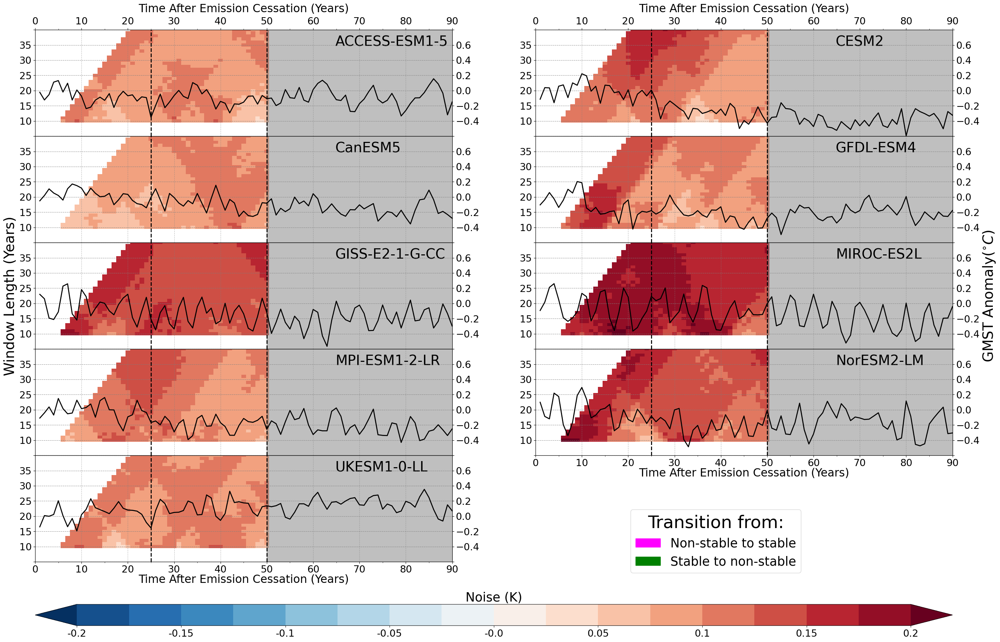

In [309]:
%matplotlib inline
models = unstable_rolling_ds.model.values
font_scale = 1.4
# max_color_lim=max_effective_length
stability_colorplot_kwargs = dict(xlims=(0, 90), patch=True, ax2_ylabel='', ylabel='',
                                  cmap='RdBu_r', bbox_to_anchor=(1, 1.4), labelpad_left=65, labelpad_right=15, extend='both',
                                  cut_ticks=2, vmax=4, step=0.5,  font_scale=1.4, cbar_label='Signal-To-Noise Ratio', hspace=0.2,
                                  return_all=True, rotation=90)

num_plots = len(models)
num_cols = 2
num_rows = int(np.ceil(num_plots/num_cols))

fig = plt.figure(figsize=(sn_plotting.plot_kwargs['width']*1.5,  sn_plotting.plot_kwargs['height']*num_plots/5))
gs = gridspec.GridSpec(num_rows+2, num_cols, height_ratios=num_rows*[1] + [0.4]+[0.2],hspace=0, wspace=0.2)
axes = [fig.add_subplot(gs[i]) for i in range(num_plots)]

for num, model in enumerate(models):
    add_colorbar=False; cax=None
    if  num == len(models)-1: add_colorbar=True; cax=fig.add_subplot(gs[num_rows+1, :])
    
    fig, returned_axes = sn_plotting.sn_multi_window_in_time(
        noise_multi_rolling_da.sel(model=model).squeeze().isel(time=slice(0, 50)),
        temp_da=a1_smean_anom_ds.squeeze().sel(model=model),
        # stable_point_ds = rolling_year_stable_ds.sel(model=model),#rolling_year_stable_ds.sel(model=model),
        fig=fig, gs=gs, ax=axes[num], cax=cax, add_colorbar=add_colorbar, yticks = np.arange(5, 45, 5),
        axes_title='', yticks_right = np.arange(-0.6, 1, .2), **noise_colorplot_kwargs) 
    
    ax, ax2, cax = returned_axes
    
    # Lines at zec25 and zec50
    ax.axvline(25, 0, 1000, color='k', linewidth=2, linestyle='--')
    ax.axvline(50, 0, 1000, color='k', linewidth=2, linestyle='--')

    # for snum,year in enumerate(year_stable_and_unstable_static_ds.sel(model=model).values):
    #     ax.axvline(year, c=line_colors[snum%2], linewidth=2.5)

    ax.axvspan(50, 90, color='grey', alpha=0.5)

    
    plotting_functions.clip_axis_ends(ax)
    plotting_functions.clip_axis_ends(ax2)

    ax.set_ylabel('')
    ax2.set_ylabel('')
    if num  == 4: ax.set_ylabel('Window Length (Years)', size=plotting_functions.PlotConfig.title_size*font_scale)
    if num  == 5: ax2.set_ylabel(f'GMST Anomaly({units})', size=plotting_functions.PlotConfig.title_size*font_scale)
    ax.annotate(model, xy=(0.72, 0.85), xycoords='axes fraction', ha='left', size=plotting_functions.PlotConfig.title_size*font_scale)
    if num <= 1:
        ax.xaxis.set_label_position('top')
        ax.xaxis.tick_top()
    
    if 1 < num < 7:
        ax.set_xticklabels([])
        ax.set_xlabel('')

magenta_patch = mpatches.Patch(color='magenta', label='Non-stable to stable')
green_patch = mpatches.Patch(color='green', label='Stable to non-stable')
leg = fig.legend(handles=[magenta_patch, green_patch], loc='lower center', ncol=1, fontsize=25, bbox_to_anchor=[0.7, 0.17])
leg.set_title('Transition from:', prop={'size': 35})

## Posters and Presentations

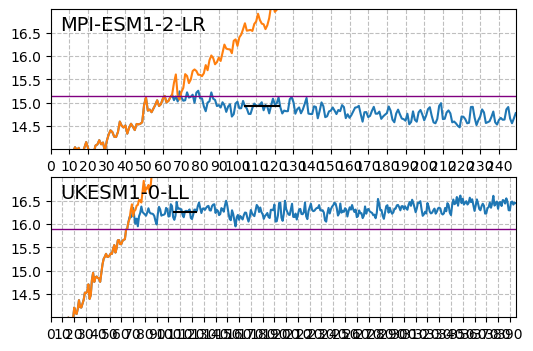

In [319]:
model_subset = ['MPI-ESM1-2-LR', 'UKESM1-0-LL']
ncols = 1
nrows = len(model_subset)

fig = plt.figure(figsize=(6*ncols, 2*nrows))
gs = gridspec.GridSpec(nrows, ncols, hspace=0.2)
axes = [fig.add_subplot(gs[i]) for i in range(len(model_subset))]

for num, model in enumerate(model_subset):
    ds_orig = pct_smean_xrlist[model]
    ax = axes[num]
    ds = ds_orig.copy(deep=True)  # Create a deep copy to avoid modifying the original dataset
    ds2 = a1_smean_xrlist[model].copy(deep=True)
    ds  = ds.sel(time=slice(None, ds2.time.values[0]))
    ds2 = ds2.combine_first(ds.isel(time=slice(-2, -1)))
    ds = ds.combine_first(ds2)
    start_arg = np.argwhere(ds.time.values == ds2.time.values[0]).item()
    
    # Ensure that reset_time_to_0_start returns a new dataset
    ds = utils.reset_time_to_0_start(ds.copy(deep=True))
    ds_orig = utils.reset_time_to_0_start(ds_orig.copy(deep=True))  # Create a deep copy to avoid modifying the original dataset
    
    ds['time'] = ds.time.dt.year.values
    ds_orig['time'] = ds_orig.time.dt.year.values
    
    ds_base = ds_orig.isel(time=slice(start_arg-10, start_arg+9))

    # A1
    ax.plot(ds.time.values, ds.squeeze().values, label='A1')
    # 1% CO2
    ax.plot(ds_orig.time.values, ds_orig.squeeze().values, label='1% CO2')

    # Vertical Line marking start of A1
    # ax.axvline(ds.time.values[start_arg], linewidth=1, color='black', label='A1 Branch Point')

    # Base period dashed line
    # ax.plot(ds_base.time.values, ds_base.squeeze().values, label='Base Period', linestyle='--', color='purple')
    
    # Line for the average of the base period
    ax.axhline(ds_base.mean(dim='time').values.item(), linewidth=1, color='purple', label='Base Period Average')
    
    #Dashed lines for ZEC25 and ZEC50
    ds_25 = ds.isel(time=slice(start_arg+25-10, start_arg+25+9))
    # ax.plot(ds_25.time.values, ds_25.squeeze().values, label='ZEC'+r'$_{25}$', linestyle='--')
    ds_50 = ds.isel(time=slice(start_arg+50-10, start_arg+50+9))
    ax.plot(ds_50.time.values, np.tile(ds_50.mean().values, len(ds_50.time.values)), color='black')
    # ax.plot(ds_50.time.values, ds_50.squeeze().values, label='ZEC'+r'$_{50}$', linestyle='--', color='black')

    ax.annotate(model, xy=(0.02, 0.85), fontsize=14, xycoords='axes fraction')
    ax.set_ylim([14, 17])
    ax.set_yticks(np.arange(14.5, 17, 0.5))
    ax.set_xlim(np.take(ds.time.values, [0, -1]))
    if num == np.ceil(len(models)/2)-1: ax.set_ylabel('GMST ' + r'($^\circ$C)', fontsize=14)
    sn_plotting.format_xticks(ax, ds.time.values, ds.time.values-1)

    ax.grid(True, alpha=0.5, c='grey', linestyle='--')
    #if num not in [7, 8]: ax.set_xticklabels('')

# Place the legend at the center just above the first row of plots
# # Adjust the bbox_to_anchor values to center the legend
# leg = axes[1].legend(ncol=7, bbox_to_anchor=[-0.05, 1.3], loc='upper center', fontsize=10)
# axes[-1].set_xlabel('Time After Emission Cessation (Years)', va='bottom', fontsize=14, labelpad=25)